In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import torch
import shapely
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly import express as px
from sklearn.linear_model import LinearRegression

import warnings, os
import mysql.connector as mysql
warnings.filterwarnings('ignore')
username = os.environ['MYSQL_user']
password = os.environ['MYSQL_password']
DB = mysql.connect(host = "localhost", user = username, passwd = password, database = "AIRBNB")
cursor = DB.cursor(buffered=True)

## Utils

In [2]:
def read_table_from_db(table_name):
    df = pd.read_sql(f'SELECT * FROM {table_name}', con=DB)
    df['geometry'] = gpd.GeoSeries.from_wkt(df['geometry'])
    df = gpd.GeoDataFrame(df, geometry='geometry')
    return df

In [3]:
def base_information(data):
    df =  pd.DataFrame(data.dtypes, columns=['dtypes'])
    df['Number of missing values'] = data.isna().sum()
    df['Percentage of missing values'] = data.isna().sum()/data.shape[0]
    df['Unique values'] = data.nunique().values
    df['Count'] = data.count().values
    return df.style.background_gradient(cmap='Blues')

In [4]:
class Plots:
    def __init__(self):
        self.quantiles_dict = {"Min": 0, "Q1": 0.25, "Med": 0.5, "Q3": 0.75, "Max": 1}

    def check_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray) and not torch.is_tensor(data):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array or torch tensor.')
        data = np.array(data)
        data = data[~np.isnan(data)]
        if(data.ndim == 2):
            data = data.squeeze()
        return data
    
    def check_2d_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray) and not torch.is_tensor(data):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array or torch tensor.')
        return np.array(data)
    
    def histogram_and_box_plot(self, data, name="", annotations=True, bin_size=1):
        data = self.check_data(data=data)
        fig = make_subplots(rows=1, cols=2, specs=[[{"type": "histogram"}, {"type": "box"}]])
        fig.add_trace(go.Box(y=data, name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data, marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data, self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data, self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data, value), text=key + ": " + str(np.round(np.quantile(data, value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def histogram_boxplot_linear_regression(self, data, feature, target, name="", annotations=True, bin_size=1):
        model = LinearRegression()
        no_nan_indices = ~data[feature].isna()
        model.fit(data[no_nan_indices][feature].values.reshape(-1, 1), data[no_nan_indices][target])
        predictions = model.predict(data[no_nan_indices][feature].values.reshape(-1, 1))
        fig = make_subplots(rows=1, cols=3, specs=[[{"type": "histogram"}, {"type": "box"}, {"type": "scatter"}]])
        fig.add_trace(go.Box(y=data[no_nan_indices][feature], name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data[no_nan_indices][feature], marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=data[no_nan_indices][target], mode='markers', marker=dict(color="lightblue"), name='Real values', showlegend=False), row=1, col=3)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=predictions, mode='lines', line_color="green", name=feature, showlegend=False), row=1, col=3)
        fig.update_xaxes(title_text=feature, row=1, col=3)
        fig.update_yaxes(title_text=f"{target}", row=1, col=3)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data[feature], self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data[feature], self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data[feature], value), text=key + ": " + str(np.round(np.quantile(data[feature], value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=2000, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def plot_time_series_count(self, data, column, agg_freq='D', title=""):
        data_copy = data.copy()
        data_copy[column] = pd.to_datetime(data_copy[column])
        data_copy.set_index(column, inplace=True)
        data_copy = data_copy.resample(agg_freq).size()
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy.values, mode='lines', line=dict(color="blue")))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{title}<b>", title_x=0.5, xaxis_title="Date", yaxis_title="Count", font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def pie_boxplot_by_categorical(self, data, categorical, target, name=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        colors = px.colors.qualitative.Dark24
        rows, columns = 1, 2
        fig = make_subplots(rows=rows, cols=columns, specs=[[{"type": "pie"}, {"type": "bar"}] for i in range(0, rows)])
        fig.add_trace(go.Pie(values=frequency, labels=labels, showlegend=True, textinfo='value+percent', hole=0.3, marker=dict(line=dict(color='black', width=2), colors=colors)), row=1, col=1)
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{name.title()} distribution<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
plots = Plots()

# Load dataset

In [5]:
listings = read_table_from_db('listings_cleaned')
listings.head()

,listing_id,listing_url,last_scraped,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,...,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,geometry,bathrooms_number,is_bathroom_shared,time_since_first_review,time_since_last_review
0,2595,https://www.airbnb.com/rooms/2595,2024-09-05,2008-09-09,within a day,51-90%,0-50%,f,7,9,...,f,3,3,0,0,POINT (-73.98559 40.75356),1.0,0,3 years and more,1 year and more
1,5121,https://www.airbnb.com/rooms/5121,2024-04-07,2009-02-03,within a day,100%,0-50%,f,2,2,...,f,2,0,2,0,POINT (-73.95512 40.68535),1.0,0,3 years and more,1 year and more
2,5136,https://www.airbnb.com/rooms/5136,2024-09-04,2009-02-03,within an hour,100%,100%,f,1,5,...,t,1,1,0,0,POINT (-73.99454 40.66265),1.5,0,3 years and more,1 year and more
3,6848,https://www.airbnb.com/rooms/6848,2024-09-05,2009-05-06,within an hour,100%,100%,t,1,1,...,f,1,1,0,0,POINT (-73.95342 40.70935),1.0,0,3 years and more,1-2 months
4,6872,https://www.airbnb.com/rooms/6872,2024-09-04,2009-05-07,within a day,0-50%,0-50%,f,2,2,...,f,2,0,2,0,POINT (-73.94255 40.80107),1.0,1,2-3 years,1 year and more


In [6]:
base_information(listings)

,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
listing_id,int64,0,0.000000,35084,35084
listing_url,object,0,0.000000,35084,35084
last_scraped,object,0,0.000000,23,35084
host_since,object,0,0.000000,4889,35084
host_response_time,object,0,0.000000,5,35084
host_response_rate,object,0,0.000000,5,35084
host_acceptance_rate,object,0,0.000000,5,35084
host_is_superhost,object,0,0.000000,2,35084
host_listings_count,int64,0,0.000000,271,35084
host_total_listings_count,int64,0,0.000000,319,35084


# Features exploration

## `price`

`price` (continous) - the price of the listing. <b>Target variable<b>.

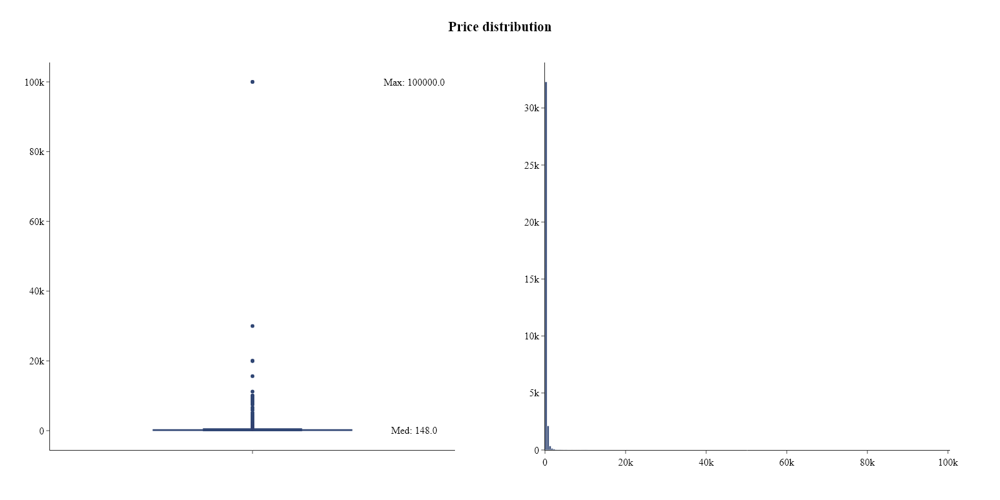

In [7]:
listings['price'] = listings['price'].str.replace('[$,]', '', regex=True).astype(float)
plots.histogram_and_box_plot(listings['price'], name="price", annotations=["Med", "Max"], bin_size=500)

**Notes:**
- The price variable has several outliers, which after analysis do not seem to be valid prices.
- After investigating the outliers, I found that the listings with price above 10 000$ are not valid.

**Conclusion:** 
- I will remove the outliers (which are above 10 000$) from the dataset.

In [8]:
price_threshold = 10000
print(f"Number of listings for which the price is greater than {price_threshold}$: {listings[listings['price'] > price_threshold].shape[0]} ({round(listings[listings['price'] > price_threshold].shape[0] / listings.shape[0] * 100, 4)}%)")
listings = listings[listings['price'] <= price_threshold]

Number of listings for which the price is greater than 10000$: 8 (0.0228%)


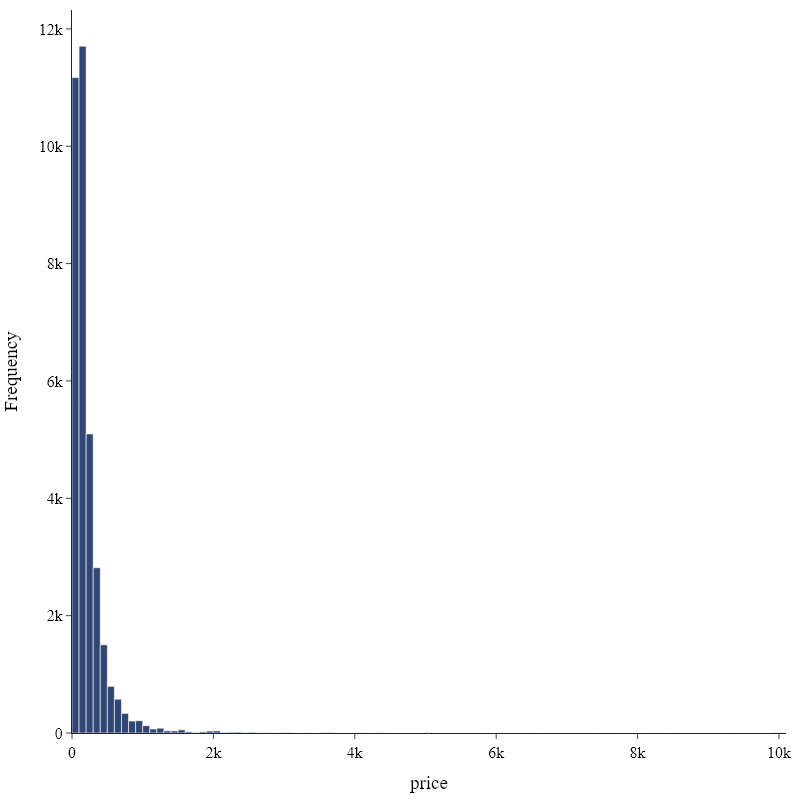

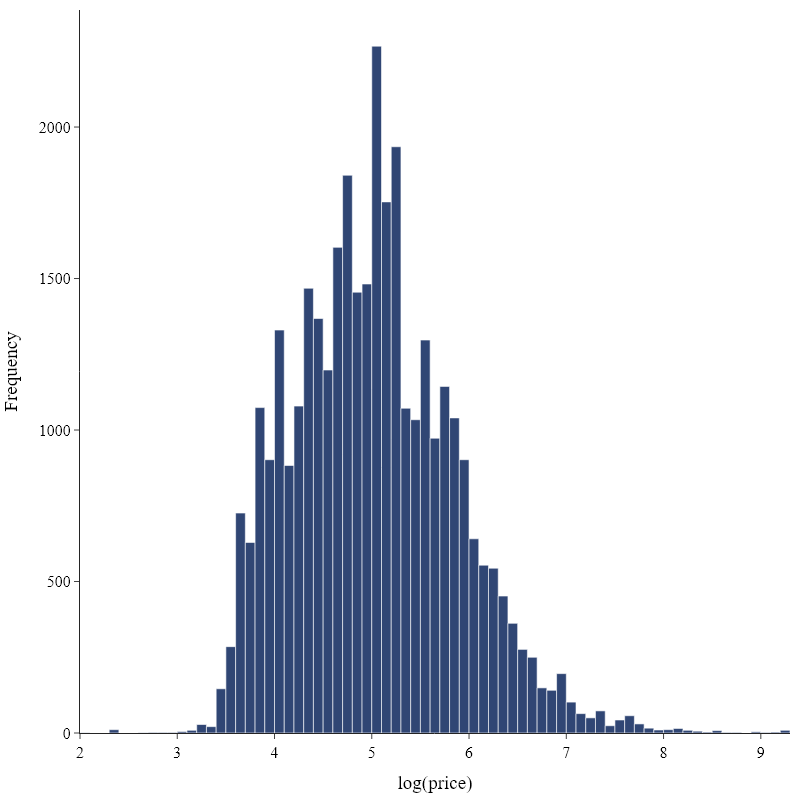

In [9]:
def histogram(data, name, bin_size=1):
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=data, marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)))
    fig.update_layout(template="simple_white", width=800, height=800, title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"), margin={'t':10,'l':10,'b':10,'r':10}, xaxis_title=name, yaxis_title="Frequency")
    fig.show("png")
listings["log_price"] = np.log(listings["price"])
histogram(listings['price'], name="price", bin_size=100)
histogram(listings['log_price'], name="log(price)", bin_size=0.1)

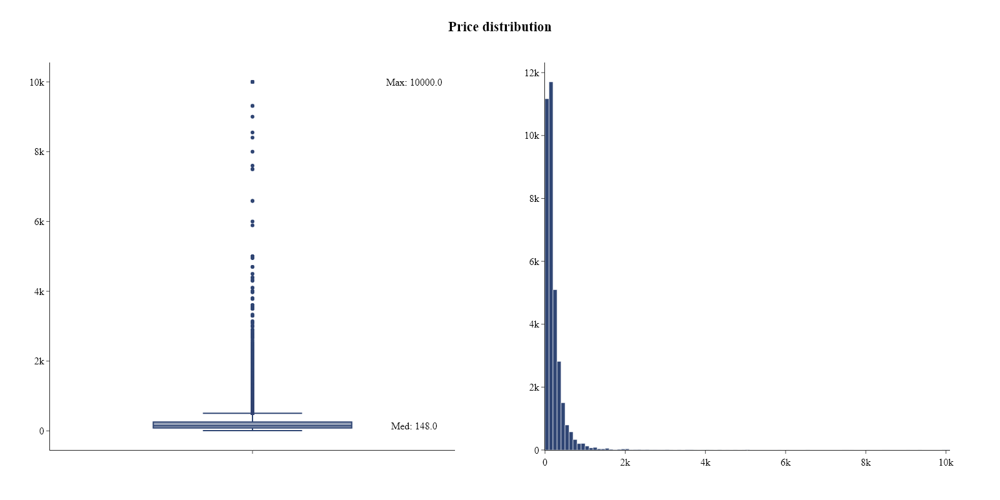

In [10]:
plots.histogram_and_box_plot(listings['price'], name="price", annotations=["Med", "Max"], bin_size=100)

**Notes:**
- The price variable is right-skewed. 
- Majority of the listings have a price below 250$ (almost 75%).

**Conclusion:**
- I will apply a log transformation to the price variable to make it more normally distributed.

In [11]:
listings["log_price"] = np.log(listings["price"])
listings.drop(columns=["price"], inplace=True)

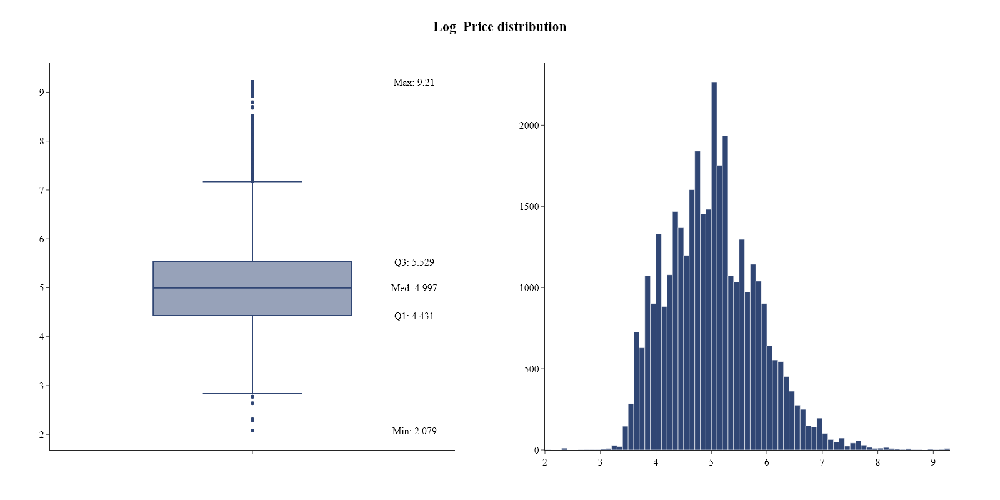

In [12]:
plots.histogram_and_box_plot(listings['log_price'], name="log_price", annotations=True, bin_size=0.1)

**Notes:**
- The distribution of target variable after applying logarithmic transformation looks more normally distributed with median around 5.

# Rental policy

## `minimum_nights`

`minimum_nights` - the minimum number of nights a guest can book the listing for.

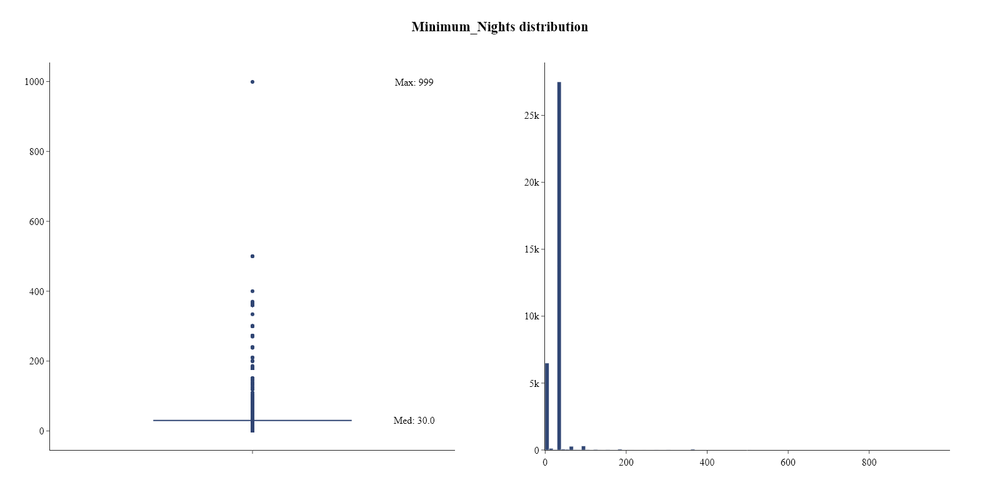

In [13]:
plots.histogram_and_box_plot(listings['minimum_nights'], name="minimum_nights", annotations=["Med", "Max"], bin_size=10)

**Notes:**
- Variable is right-skewed.

**Conclusion:**
- Due to the fact that the we want to analyse SHORT-TERM rentals, I will remove the outliers (which are above 30 days) from the dataset.

In [14]:
minimum_nights_threshold = 30
print(f"Number of listings for which the minimum_nights is greater than {minimum_nights_threshold} days: {listings[listings['minimum_nights'] > minimum_nights_threshold].shape[0]} ({round(listings[listings['minimum_nights'] > minimum_nights_threshold].shape[0] / listings.shape[0] * 100, 4)}%)")
listings = listings[listings['minimum_nights'] <= minimum_nights_threshold]

Number of listings for which the minimum_nights is greater than 30 days: 2254 (6.426%)


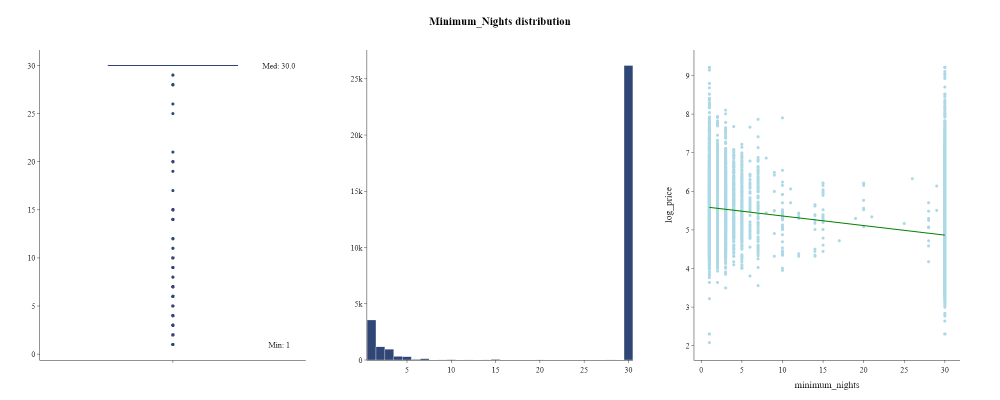

In [15]:
plots.histogram_boxplot_linear_regression(listings, "minimum_nights", "log_price", name="minimum_nights", annotations=["Min", "Med"], bin_size=1)

**Notes:**
- Plot with linear relationship between `minimum_nights` and `price` shows that as the minimum number of nights increases, the price of the listing decreases (however, the relationship is not linear).

We can check now how the distribution of the `log_price` variable looks like after filtering dataset based on `minimum_nights` variable.

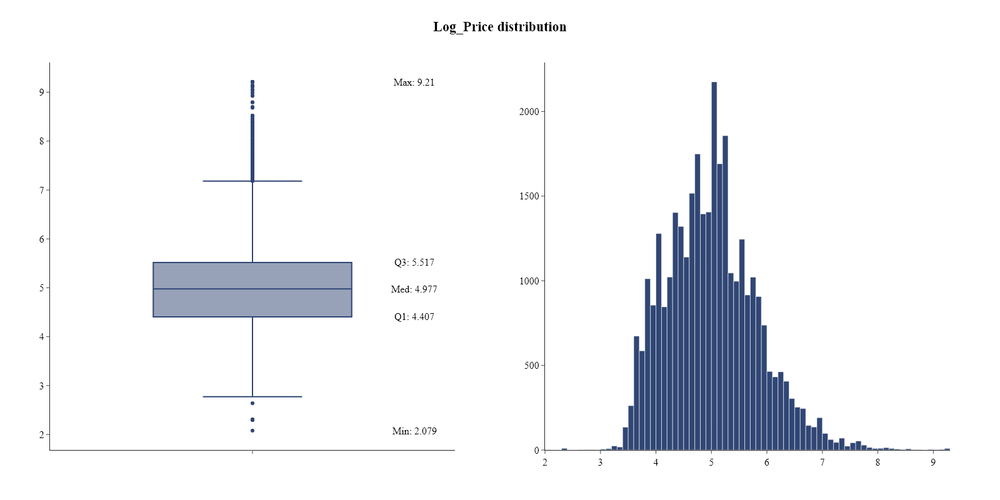

In [16]:
plots.histogram_and_box_plot(listings['log_price'], name="log_price", annotations=True, bin_size=0.1)

**Notes:**
- The distribution of the `log_price` variable has almost not changed at all after filtering the dataset based on the `minimum_nights` variable.

## `maximum_nights`

`maximum_nights` - the maximum number of nights a guest can book the listing for.

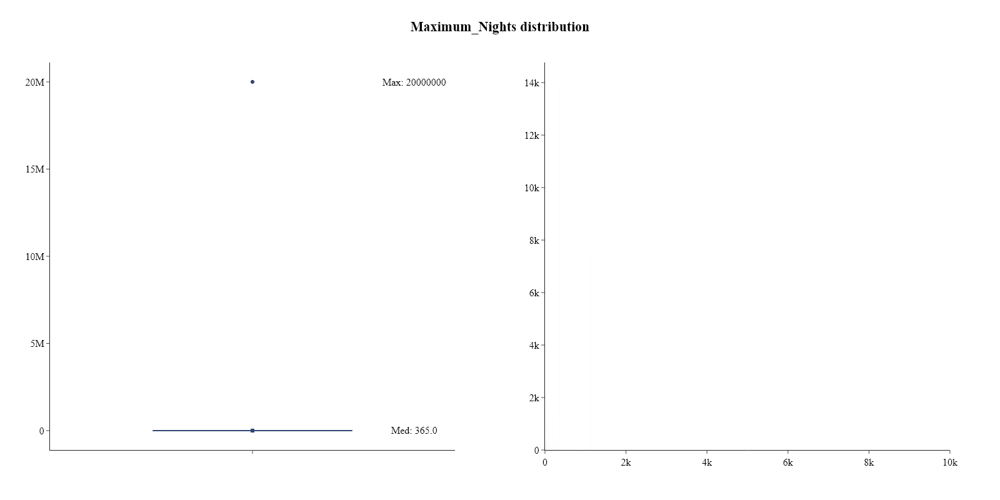

In [17]:
plots.histogram_and_box_plot(listings['maximum_nights'], name="maximum_nights", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- There is one strange outlier with a value above 20 million days. However listing looks valid, therefore I will use winsorization to handle all outliers above 99th percentile.

**Conclusion:**
- I will apply winsorization to the `maximum_nights` variable to handle the outliers.

In [18]:
ninetyninth_percentile = np.percentile(listings['maximum_nights'], 99)
print("99th percentile of maximum nights:", ninetyninth_percentile)
listings.loc[listings['maximum_nights'] > ninetyninth_percentile, 'maximum_nights'] = ninetyninth_percentile

99th percentile of maximum nights: 1125.0


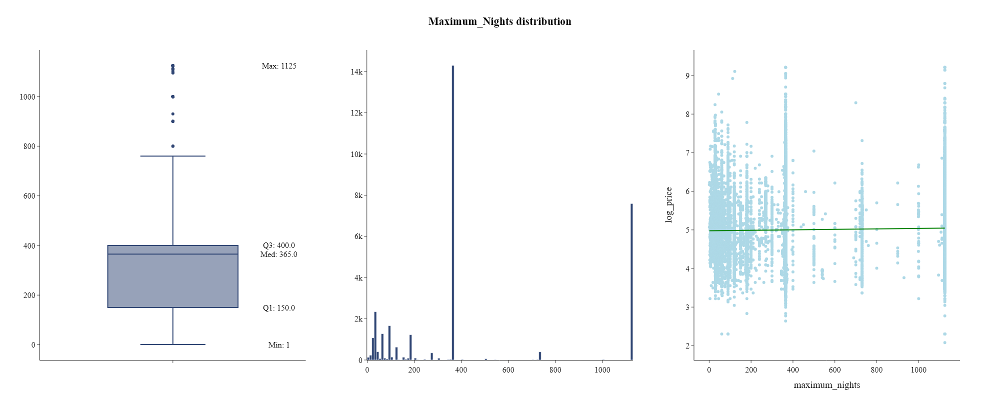

In [19]:
plots.histogram_boxplot_linear_regression(listings, "maximum_nights", "log_price", name="maximum_nights", annotations=True, bin_size=10)

**Notes:**
- After winsorization, we can see that most of the listings have a maximum number of nights equal to 365 days.
- The relationship between the `maximum_nights` and `log_price` variables is not linear.

## `minimum_minimum_nights`, `maximum_minimum_nights`, `minimum_nights_avg_ntm`

`minimum_minimum_nights` - the smallest minimum_night value from the calender (looking 365 nights in the future)

`maximum_minimum_nights` - the largest minimum_night value from the calender (looking 365 nights in the future)

`minimum_nights_avg_ntm` - the average minimum_night value from the calender (looking 365 nights in the future)

I will calculate the correlation between above variables and `minimum_nights` variable (due to my assumption that they should be highly correlated).

In [20]:
listings[["minimum_nights", "minimum_minimum_nights", "maximum_minimum_nights", "minimum_nights_avg_ntm"]].corr(method="spearman")

,minimum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_nights_avg_ntm
minimum_nights,1.000000,0.986065,0.940304,0.971159
minimum_minimum_nights,0.986065,1.000000,0.945490,0.978327
maximum_minimum_nights,0.940304,0.945490,1.000000,0.972694
minimum_nights_avg_ntm,0.971159,0.978327,0.972694,1.000000


**Notes:**
- The correlation between `minimum_nights` and other variables is very high, which confirms my assumption.

**Conclusion:**
- Due to the high correlation between `minimum_nights` and other variables, I will remove them from the dataset because they do not provide any additional information and may cause multicollinearity.

In [21]:
listings.drop(["minimum_minimum_nights", "maximum_minimum_nights", "minimum_nights_avg_ntm"], axis=1, inplace=True)

## `maximum_maximum_nights`, `minimum_maximum_nights`, `maximum_nights_avg_ntm`

`maximum_maximum_nights` - the largest maximum_night value from the calender (looking 365 nights in the future)

`minimum_maximum_nights` - the smallest maximum_night value from the calender (looking 365 nights in the future)

`maximum_nights_avg_ntm` - the average maximum_night value from the calender (looking 365 nights in the future)

Similarly to the previous step, I will calculate the correlation between above variables and `maximum_nights` variable.

In [22]:
listings[["maximum_nights", "maximum_maximum_nights", "minimum_maximum_nights", "maximum_nights_avg_ntm"]].corr(method="spearman")

,maximum_nights,maximum_maximum_nights,minimum_maximum_nights,maximum_nights_avg_ntm
maximum_nights,1.000000,0.627093,0.497968,0.566398
maximum_maximum_nights,0.627093,1.000000,0.840233,0.940998
minimum_maximum_nights,0.497968,0.840233,1.000000,0.944612
maximum_nights_avg_ntm,0.566398,0.940998,0.944612,1.000000


**Notes:**
- Once again, the correlation is pretty high between `maximum_nights` and other variables.

**Conclusion:**
- I will remove the variables from the dataset due to the high correlation with `maximum_nights` variable.

In [23]:
listings.drop(["maximum_maximum_nights", "minimum_maximum_nights", "maximum_nights_avg_ntm"], axis=1, inplace=True)

### `availability_30`, `availability_60`, `availability_90`, `availability_365`

`availability_30` - the number of days that the listing is available for the next 30 days.

`availability_60` - the number of days that the listing is available for the next 60 days.

`availability_90` - the number of days that the listing is available for the next 90 days.

`availability_365` - the number of days that the listing is available for the next 365 days.

Worth to note that the listing may be unabaliable due to the fact that it is already booked but also due to the fact that the host does not want to rent it.

In [24]:
listings[['availability_30', 'availability_60', 'availability_90', 'availability_365', 'log_price']].corr(method='spearman')

,availability_30,availability_60,availability_90,availability_365,log_price
availability_30,1.000000,0.942637,0.902265,0.437486,0.053173
availability_60,0.942637,1.000000,0.978856,0.487457,0.018034
availability_90,0.902265,0.978856,1.000000,0.534618,0.019228
availability_365,0.437486,0.487457,0.534618,1.000000,0.030837
log_price,0.053173,0.018034,0.019228,0.030837,1.000000


**Notes:**
- Correlation between `availability_30`, `availability_60` and `availability_90` is very high ~0.9.
- Biggest Spearman correlation between availability variables and `log_price` is between `availability_365` and `availability_30`.

**Conclusion:**
- Due to the fact that the correlation between `availability_30`, `availability_60` and `availability_90` is very high, I will remove the last two mentioned variables from the dataset as they are less correlated with the target variable.

In [25]:
listings.drop(['availability_60', 'availability_90'], axis=1, inplace=True)

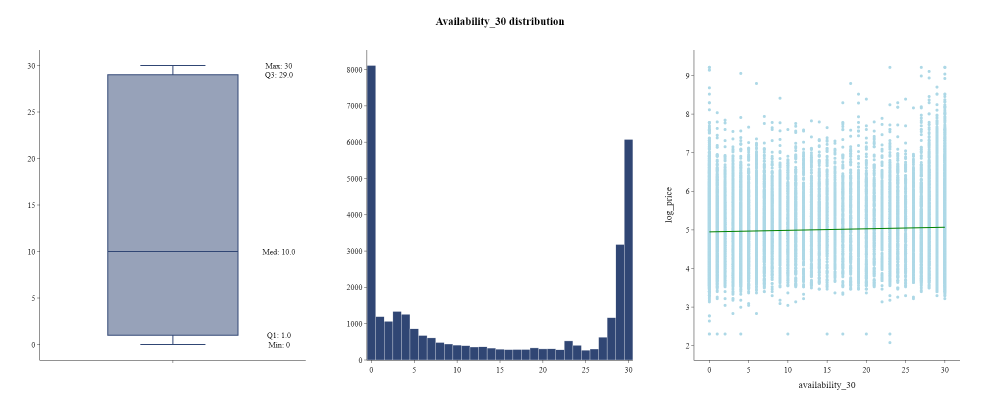

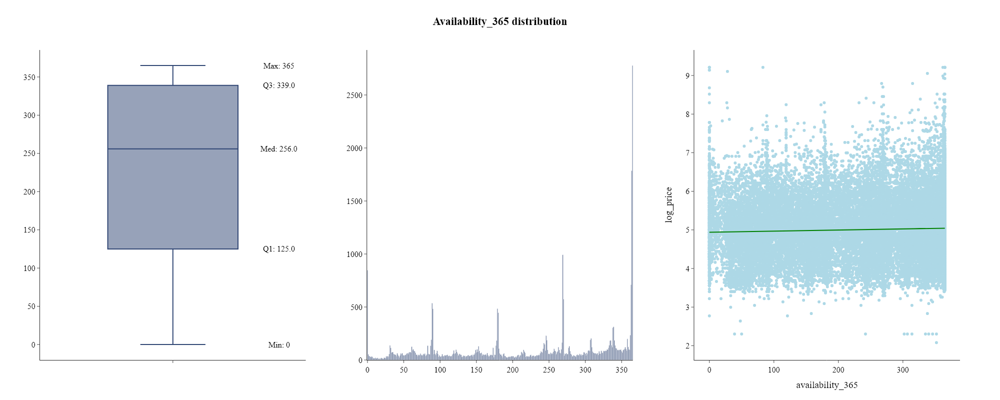

In [26]:
plots.histogram_boxplot_linear_regression(listings, "availability_30", "log_price", name="availability_30", annotations=True, bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "availability_365", "log_price", name="availability_365", annotations=True, bin_size=1)

**Notes:**
- For both variables there is almost no linear relationship with `log_price` as the regression line is flat.

## `instant_bookable`

`instant_bookable` - whether the listing is instantly bookable or not.

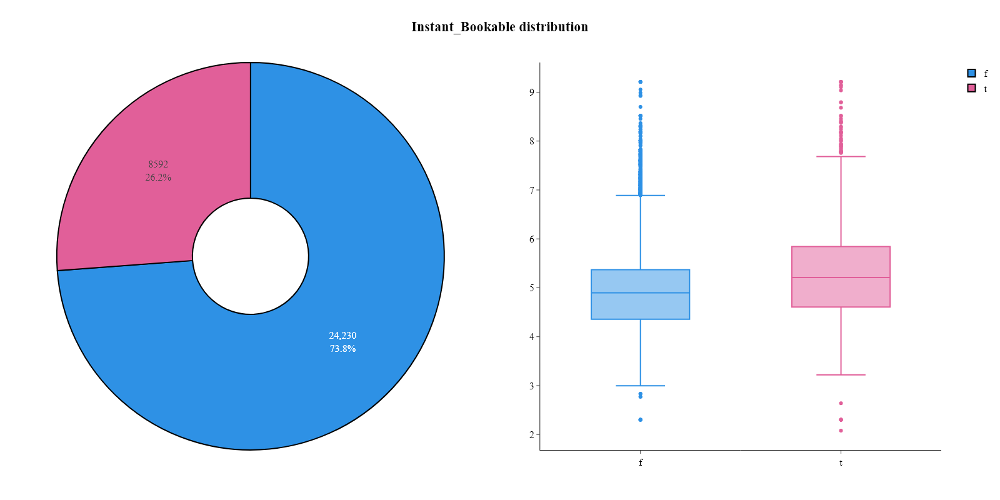

In [27]:
plots.pie_boxplot_by_categorical(listings, "instant_bookable", "log_price", name="instant_bookable")

**Notes:**
- `instant_bookable` is a binary variable.
- 1/3 of the listings are instantly bookable and it seems that the listings for which the `instant_bookable` is equal to 1 have slightly higher median `log_price`.

**Conclusion:**
- I will use Label-Encoder to convert the `instant_bookable` variable into a numerical format (0 - not instantly bookable, 1 - instantly bookable).

In [28]:
listings['instant_bookable'] = listings['instant_bookable'].map({'t': 1, 'f': 0}).astype(bool)

# Host attributes

## `host_since`

`host_since` - the date the host first joined Airbnb.

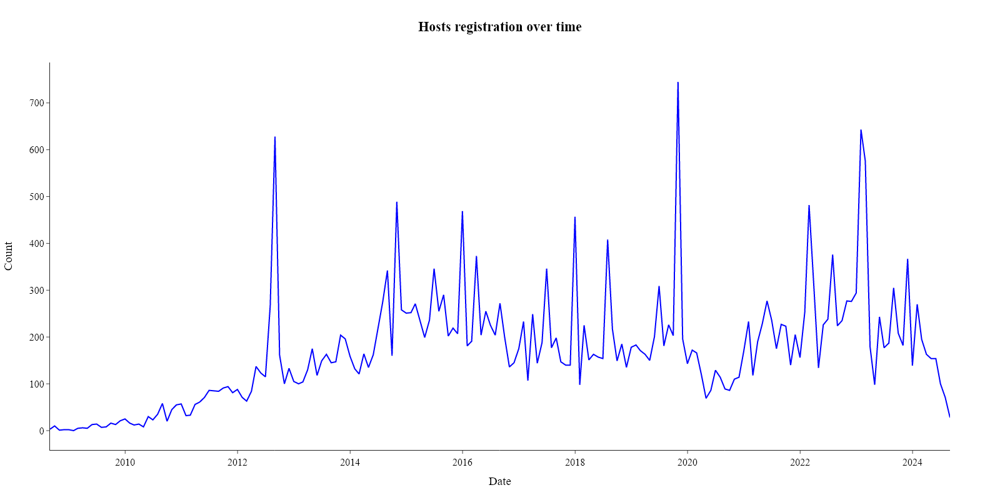

In [29]:
plots.plot_time_series_count(listings, column='host_since', agg_freq="M", title='Hosts registration over time')

**Notes:**
- Since the beginning of data, the number of hosts has been increasing and stabilized around 200 of hosts registrations per month.

**Conclusion:**
- We will create a new feature `days_since_host` to represent the number of days since the host first joined Airbnb.

In [30]:
listings['host_since'] = pd.to_datetime(listings['host_since'])
listings["last_scraped"] = pd.to_datetime(listings["last_scraped"])
listings["days_since_host"] = (listings["last_scraped"] - listings["host_since"]).dt.days

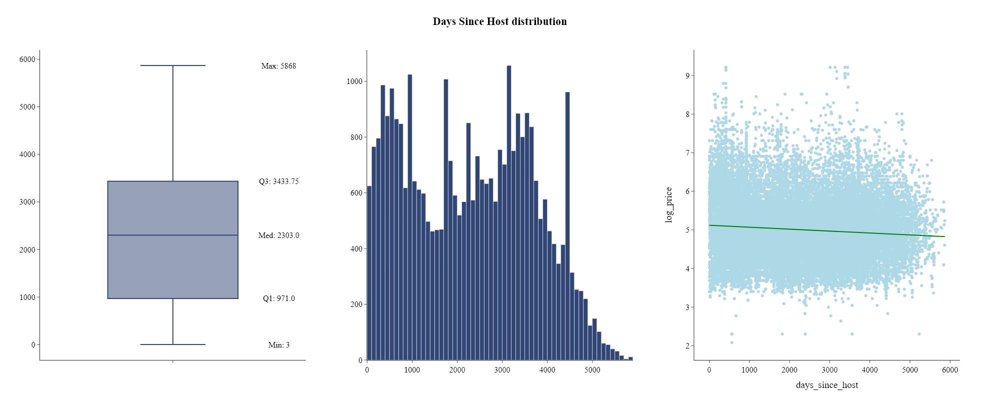

In [31]:
plots.histogram_boxplot_linear_regression(listings, "days_since_host", "log_price", name="Days since host", annotations=True, bin_size=100)

**Notes:**
- Median of `days_since_host` is 2303 days, which is approximately 6 years.
- There is no strong linear relationship between `days_since_host` and `log_price` since the linear regression line is almost flat.

**Conclusion:**
- I will remove the `host_since` and `last_scraped` variables from the dataset as they are no longer needed.

In [32]:
listings.drop(["host_since", "last_scraped"], axis=1, inplace=True)

## `host_response_time`

`host_response_time` - the time the host takes to respond to a message. It is a categorical variable.

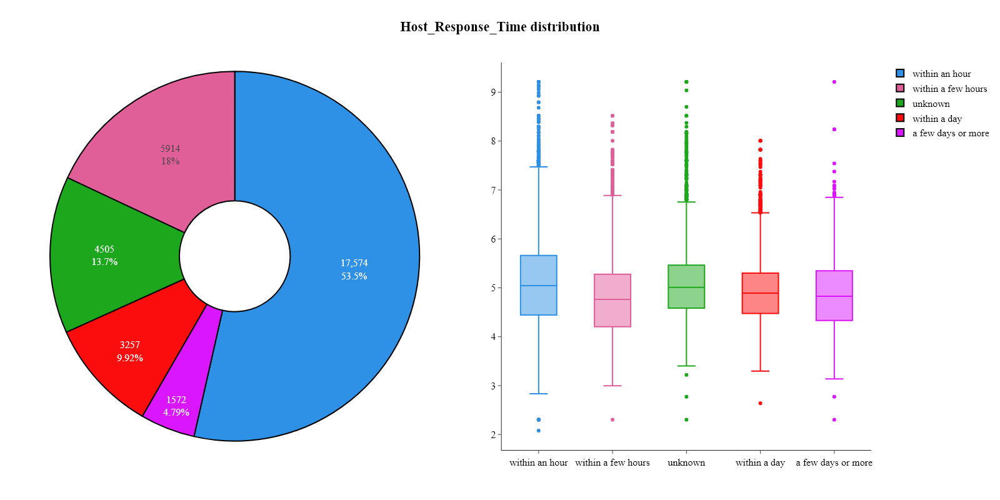

In [33]:
plots.pie_boxplot_by_categorical(listings, "host_response_time", "log_price", name="host_response_time")

**Notes:**
- The most common response time is within an hour.
- There is not much difference in the price between different response times.

**Conclusion:**
- Due to the fact that there is no ordinal relationship between the response times (because of "unknow" category), I will use One-Hot Encoding to convert the `host_response_time` variable into a numerical format ("unknown" will be the reference category).

In [34]:
listings = pd.get_dummies(listings, columns=['host_response_time'], drop_first=False)
listings.drop(['host_response_time_unknown'], axis=1, inplace=True)

## `host_response_rate`

`host_response_rate` - the response rate of the host.

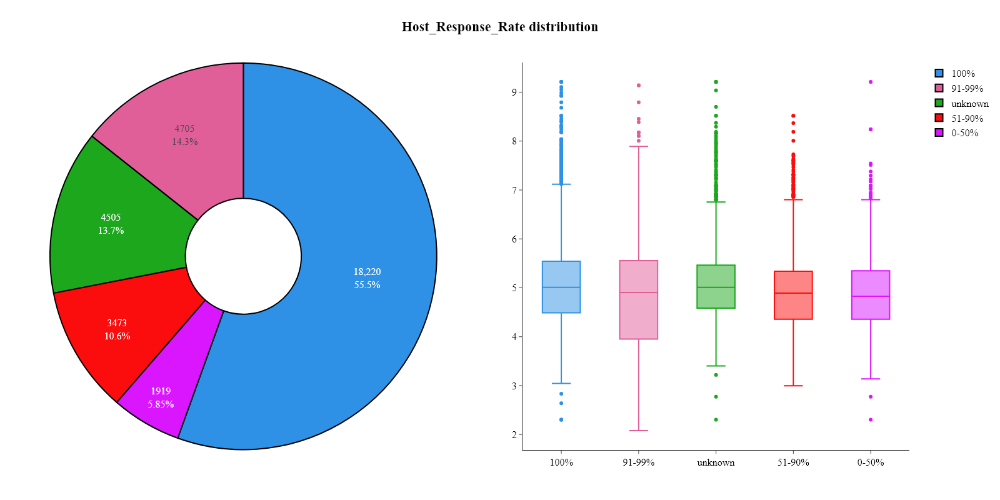

In [35]:
plots.pie_boxplot_by_categorical(listings, "host_response_rate", "log_price", name="host_response_rate")

**Notes:**
- The most common response rate is 100%.
- It seems that the listings for which the host has a response rate of 0-50% have slightly lower median price.

**Conclusion:**
- I will use One-Hot Encoding to convert the `host_response_rate` variable into a numerical format.

In [36]:
listings = pd.get_dummies(listings, columns=['host_response_rate'], drop_first=False)
listings.drop(['host_response_rate_unknown'], axis=1, inplace=True)

## `host_acceptance_rate`

`host_acceptance_rate` - the acceptance rate of the host.

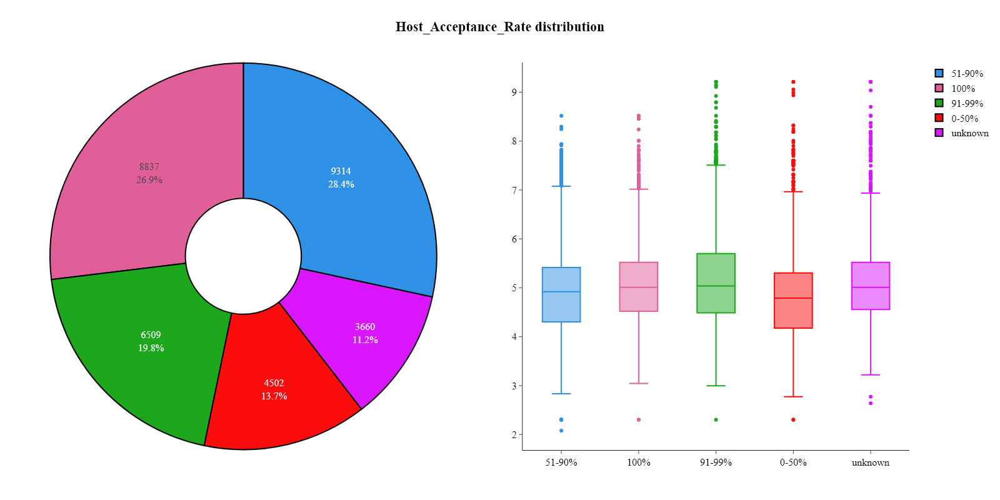

In [37]:
plots.pie_boxplot_by_categorical(listings, "host_acceptance_rate", "log_price", name="host_acceptance_rate")

**Notes:**
- The most common acceptance rate is 51-90%.
- There is not much difference in the price between different acceptance rates.

**Conclusion:**
- I will use One-Hot Encoding to convert the `host_acceptance_rate` variable into a numerical format.

In [38]:
listings = pd.get_dummies(listings, columns=['host_acceptance_rate'], drop_first=False)
listings.drop(['host_acceptance_rate_unknown'], axis=1, inplace=True)

## `host_is_superhost`

`host_is_superhost` - whether the host is a superhost or not.

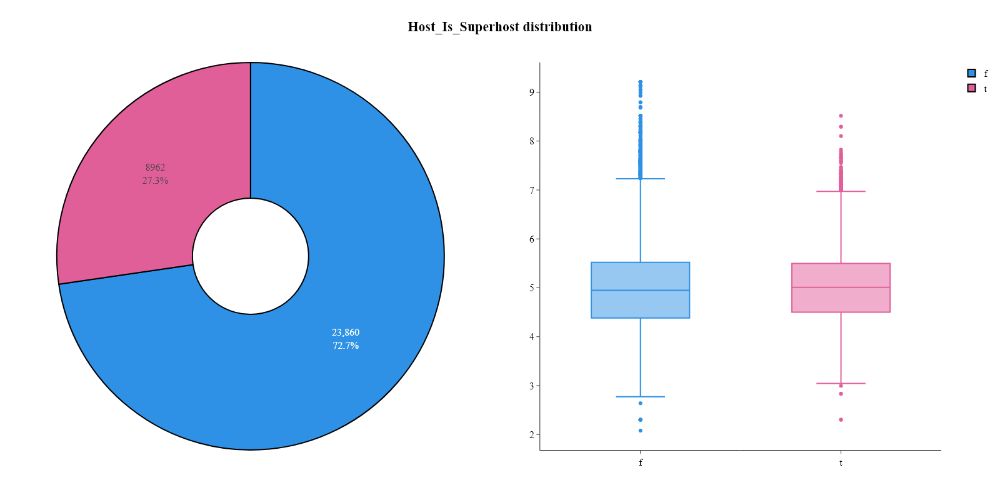

In [39]:
plots.pie_boxplot_by_categorical(listings, "host_is_superhost", "log_price", name="host_is_superhost")

**Notes:**
- `host_is_superhost` is a binary variable.
- Approximately 3/4 of the hosts are not superhosts.

**Conclusion:**
- I will use Label-Encoder to convert the `host_is_superhost` variable into a numerical format (0 - not superhost, 1 - superhost).

In [40]:
listings['host_is_superhost'] = listings['host_is_superhost'].map({'t': 1, 'f': 0}).astype(bool)

### `host_listings_count`, `host_total_listings_count`, `calculated_host_listings_count`

`host_listings_count` - the number of listings the host has.

`calculated_host_listings_count` - the number of listings the host has in the city/region geography.

`host_total_listings_count` - the number of listings the host has (including active, inactive, and archived).

I will calculate the spearman correlation between above variables, since they should be highly correlated.

In [41]:
listings[['host_listings_count', 'calculated_host_listings_count', 'host_total_listings_count']].corr(method='spearman')

,host_listings_count,calculated_host_listings_count,host_total_listings_count
host_listings_count,1.000000,0.957844,0.920568
calculated_host_listings_count,0.957844,1.000000,0.883698
host_total_listings_count,0.920568,0.883698,1.000000


**Notes:**
- The correlation between host listings count variables is very high, which confirms my assumption.

**Conclusion:**
- I will keep only the `host_listings_count` variable and remove the other two due to the high correlation.

In [42]:
listings.drop(["calculated_host_listings_count", "host_total_listings_count"], axis=1, inplace=True)

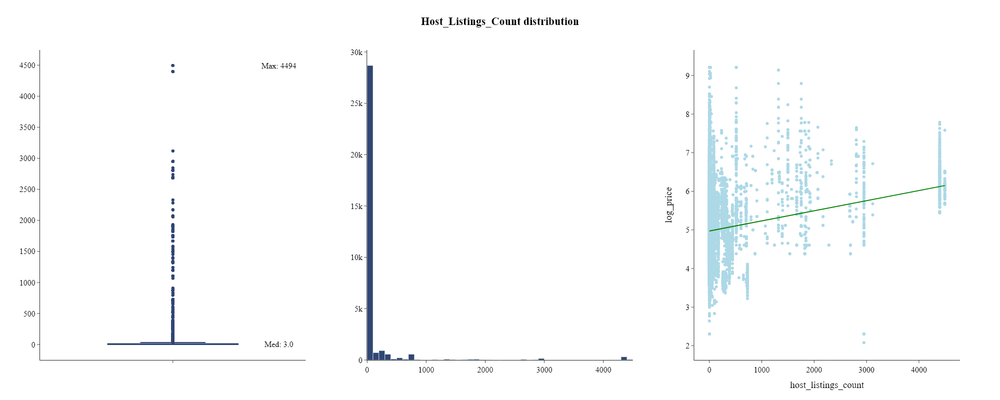

In [43]:
plots.histogram_boxplot_linear_regression(listings, "host_listings_count", "log_price", name="host_listings_count", annotations=["Med", "Max"], bin_size=100)

**Notes:**
- Distribution of the `host_listings_count` variable is right-skewed.
- It seems like the more listings the host has, the higher the price of the listing.

**Conclusions:**
- Due to the right skewness of variable we will apply logarithmic transformation.

In [44]:
listings["log_host_listings_count"] = np.log(listings["host_listings_count"])
listings.drop(columns=["host_listings_count"], inplace=True)

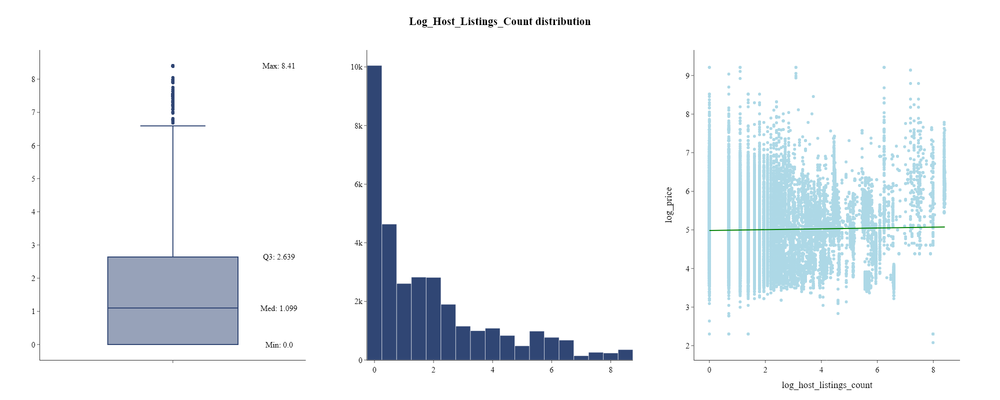

In [45]:
plots.histogram_boxplot_linear_regression(listings, "log_host_listings_count", "log_price", name="log_host_listings_count", annotations=["Min", "Med", "Q3", "Max"], bin_size=0.5)

**Notes:**
- After applying logarithmic transformation, the distribution is still right-skewed, but the skewness has been reduced.
- The relationship between `log_host_listings_count` and `log_price` is not linear.

### `calculated_host_listings_count_entire_homes`, `calculated_host_listings_count_private_rooms`, `calculated_host_listings_count_shared_rooms`

`calculated_host_listings_count_entire_homes` - the number of entire homes that the host has in the current scrape, in the city/region geography.

`calculated_host_listings_count_private_rooms` - the number of private rooms that the host has in the current scrape, in the city/region geography.

`calculated_host_listings_count_shared_rooms` - the number of shared rooms that the host has in the current scrape, in the city/region geography.

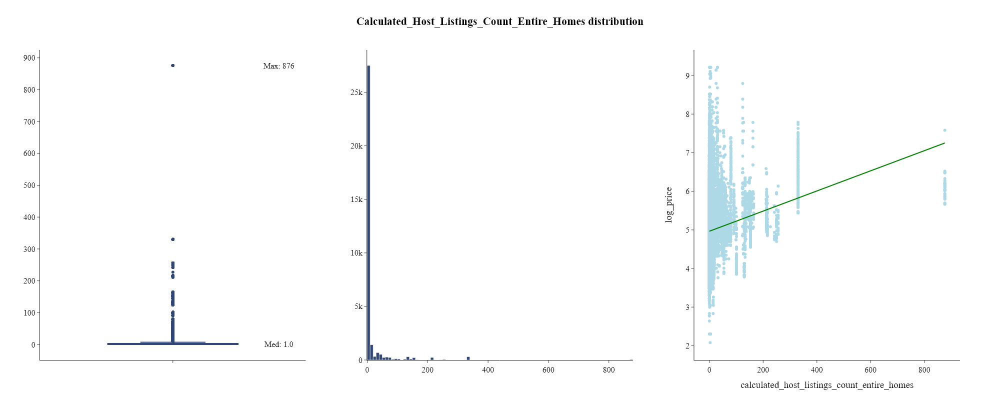

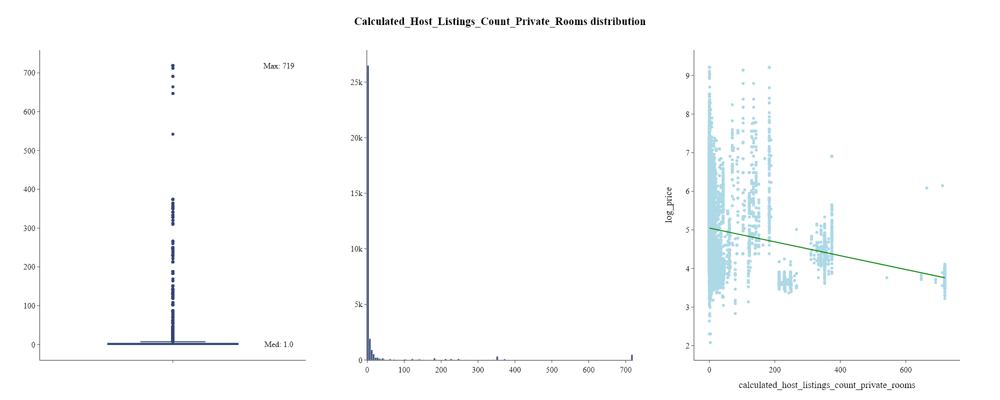

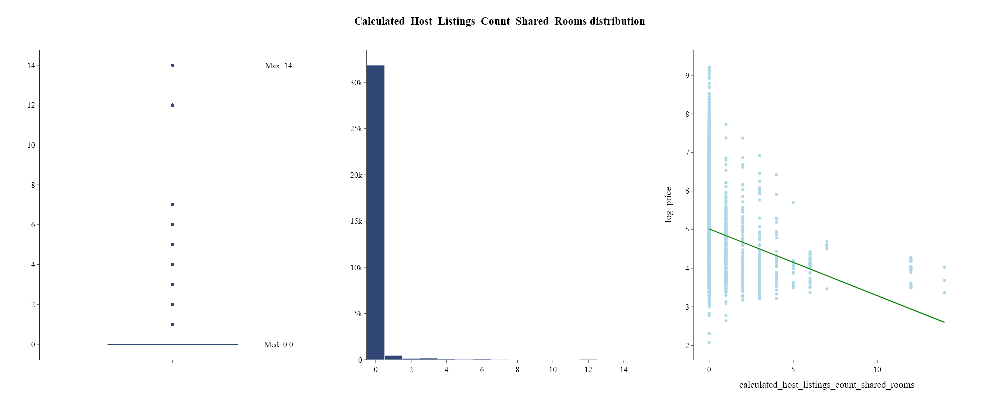

In [46]:
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_entire_homes", "log_price", name="calculated_host_listings_count_entire_homes", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_private_rooms", "log_price", name="calculated_host_listings_count_private_rooms", annotations=["Med", "Max"], bin_size=5)
plots.histogram_boxplot_linear_regression(listings, "calculated_host_listings_count_shared_rooms", "log_price", name="calculated_host_listings_count_shared_rooms", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- The distribution of the `calculated_host_listings_count_entire_homes`, `calculated_host_listings_count_private_rooms` and `calculated_host_listings_count_shared_rooms` variables are right-skewed.
- Most of the hosts do not have any shared rooms, and feature looks like redundant, however it will be kept for now and I will investigate it further durring statistical analysis.

**Conclusion:**
- I can't apply log transformation to above variables due to 0 values, therefore I will apply a square root transformation to make them more normally distributed.

In [47]:
listings["root_calculated_host_listings_count_entire_homes"] = np.sqrt(listings["calculated_host_listings_count_entire_homes"])
listings["root_calculated_host_listings_count_private_rooms"] = np.sqrt(listings["calculated_host_listings_count_private_rooms"])
listings["root_calculated_host_listings_count_shared_rooms"] = np.sqrt(listings["calculated_host_listings_count_shared_rooms"])
listings.drop(['calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms'], axis=1, inplace=True)

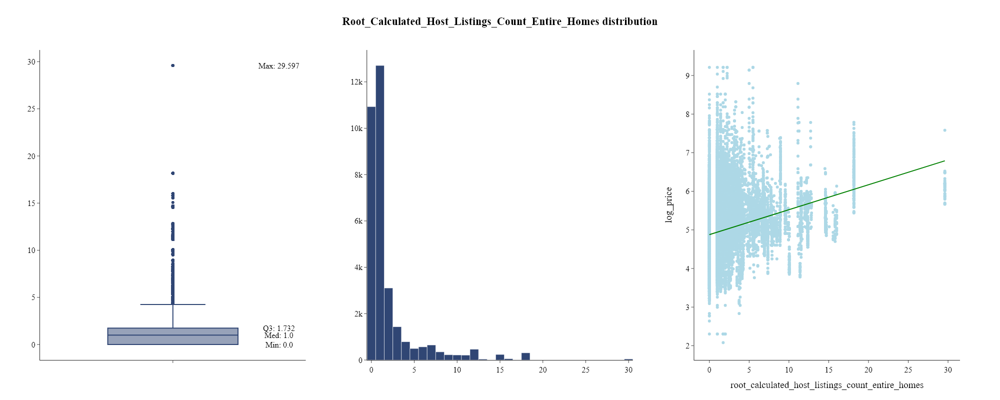

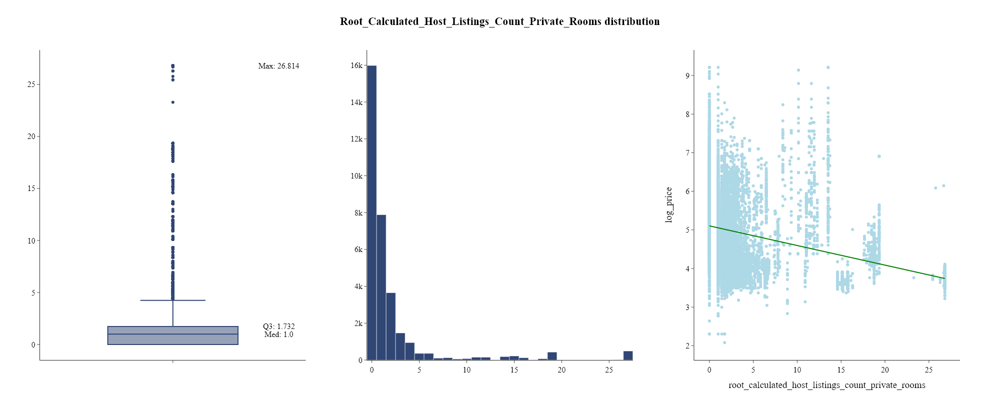

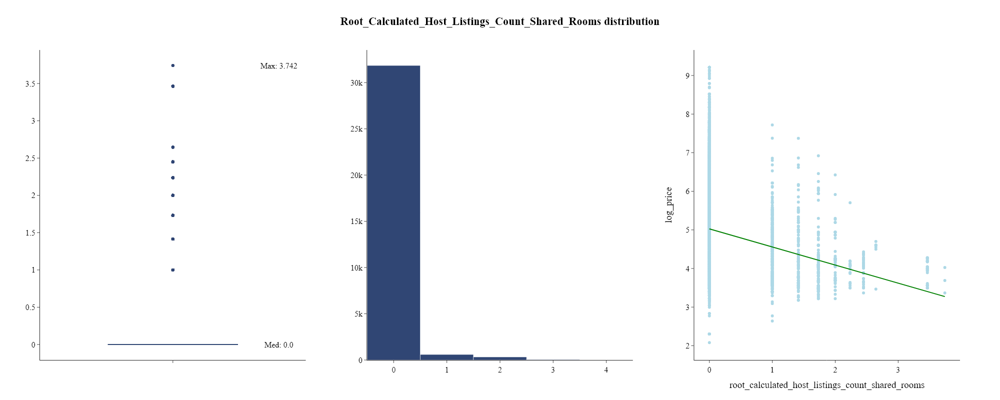

In [48]:
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_entire_homes", "log_price", name="root_calculated_host_listings_count_entire_homes", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_private_rooms", "log_price", name="root_calculated_host_listings_count_private_rooms", annotations=["Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_calculated_host_listings_count_shared_rooms", "log_price", name="root_calculated_host_listings_count_shared_rooms", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- Applying square root transformation to the variables did not make them normally distributed, but the skewness and spread of the data have been reduced.

## `host_verifications`

`host_verifications` - the verifications that the host has.

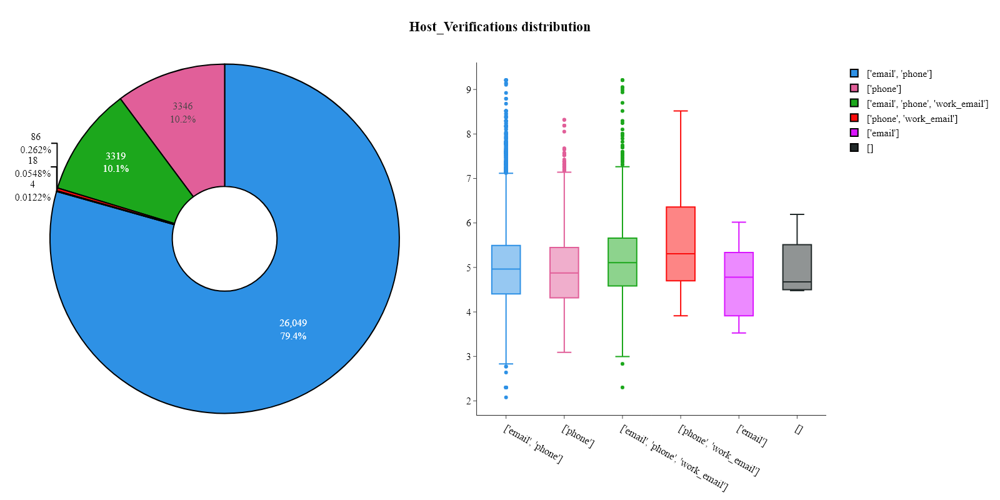

In [49]:
plots.pie_boxplot_by_categorical(listings, "host_verifications", "log_price", name="host_verifications")

**Notes:**
- The categories are quite strange and are a list of verifications that the host has.
- The most common verification is ['email', 'phone'].

**Conclusion:**
- I will create seperate binary columns for each verification type (except of photographer which is less common) and one more column with the total number of verifications.

In [50]:
listings["host_verification_email"] = listings["host_verifications"].apply(lambda x: 1 if 'email' in x else 0).astype(bool)
listings["host_verification_phone"] = listings["host_verifications"].apply(lambda x: 1 if 'phone' in x else 0).astype(bool)
listings["host_verification_work_email"] = listings["host_verifications"].apply(lambda x: 1 if 'work_email' in x else 0).astype(bool)
listings["host_verification_count"] = listings["host_verifications"].apply(lambda x: x.count("'")//2)
listings.drop(['host_verifications'], axis=1, inplace=True)

## `host_has_profile_pic`

`host_has_profile_pic` - whether the host has a profile picture or not.

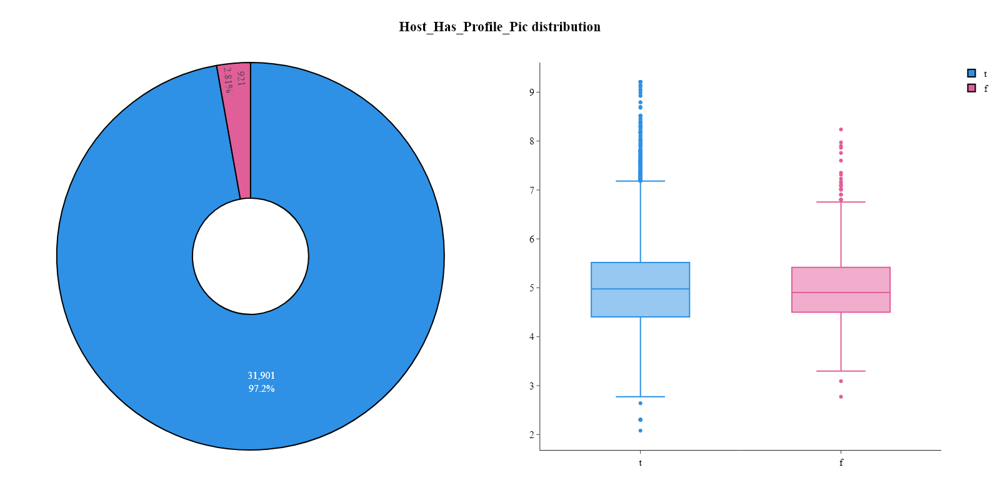

In [51]:
plots.pie_boxplot_by_categorical(listings, "host_has_profile_pic", "log_price", name="host_has_profile_pic")

**Notes:**
- `host_has_profile_pic` is a binary variable.
- Almost all hosts have a profile picture and it seems that the listings for which the host has a profile picture have slightly higher median price.

**Conclusion:**
- I will use Label-Encoder to convert the `host_has_profile_pic` variable into a numerical format (0 - no profile picture, 1 - profile picture).

In [52]:
listings['host_has_profile_pic'] = listings['host_has_profile_pic'].map({'t': 1, 'f': 0}).astype(bool)

## `host_identity_verified`

`host_identity_verified` - whether the host has verified their identity or not.

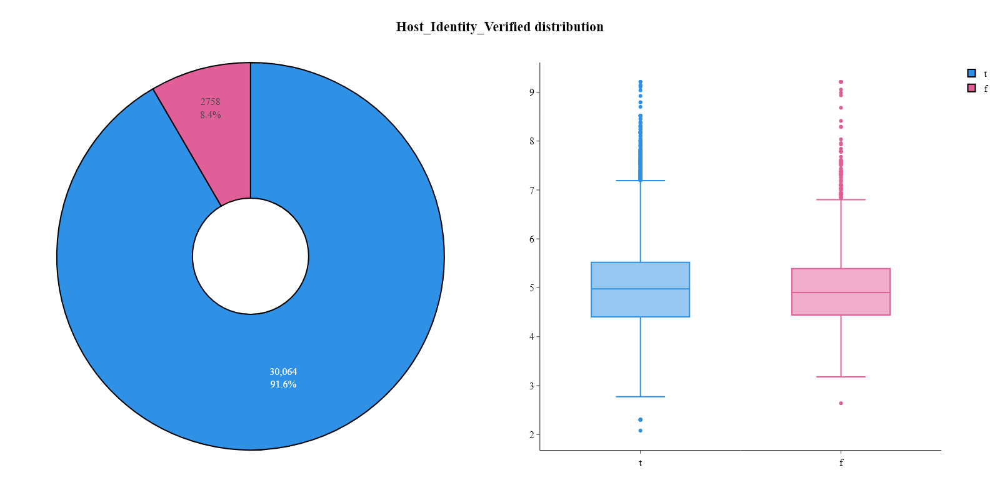

In [53]:
plots.pie_boxplot_by_categorical(listings, "host_identity_verified", "log_price", name="host_identity_verified")

**Notes:**
- `host_identity_verified` is a binary variable.
- Almost all hosts have verified their identity and it seems that the listings for which the host has verified their identity have slightly higher median price.

**Conclusion:**
- I will use Label-Encoder to convert the `host_identity_verified` variable into a numerical format (0 - not verified, 1 - verified).

In [54]:
listings['host_identity_verified'] = listings['host_identity_verified'].map({'t': 1, 'f': 0}).astype(bool)

# Property attributes

## `property_type`

`property_type` - self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field

In [55]:
print("Number of unique values in property_type:", listings['property_type'].nunique())
print("\nUnique values in property_type:\n")
print("\n".join(listings['property_type'].unique()))

Number of unique values in property_type: 70

Unique values in property_type:

Entire rental unit
Private room in rental unit
Private room in condo
Private room in guest suite
Entire place
Entire loft
Private room in townhouse
Entire condo
Private room in loft
Entire townhouse
Entire home
Private room in home
Entire guesthouse
Shared room in rental unit
Room in boutique hotel
Private room in bed and breakfast
Entire serviced apartment
Entire guest suite
Private room in houseboat
Private room in vacation home
Shared room in home
Private room
Private room in guesthouse
Boat
Room in serviced apartment
Entire cottage
Private room in religious building
Casa particular
Private room in villa
Private room in serviced apartment
Shared room in townhouse
Private room in tiny home
Entire bungalow
Room in hotel
Shared room in condo
Houseboat
Entire villa
Floor
Private room in casa particular
Tiny home
Shared room in loft
Room in aparthotel
Private room in bungalow
Entire vacation home
Private room 

There are many categories in the `property_type` variable, therefore after investigating the categories I will group them into more general categories:
- Apartment
- House
- Other

In [56]:
property_type_mapping = {'Apartment': ["Entire rental unit", "Private room in rental unit", "Entire condo", "Private room in condo", "Entire serviced apartment", "Entire loft", "Room in aparthotel"],
                        "House": ["Private room in home", "Entire home", "Private room in townhouse", "Entire townhouse", "Private room in bed and breakfast", "Private room in guesthouse", "Entire guesthouse", "Private room in guest suite", "Entire guest suite"]}
listings['property_type'] = listings['property_type'].apply(lambda x: 'Apartment' if x in property_type_mapping['Apartment'] else ('House' if x in property_type_mapping['House'] else 'Other'))

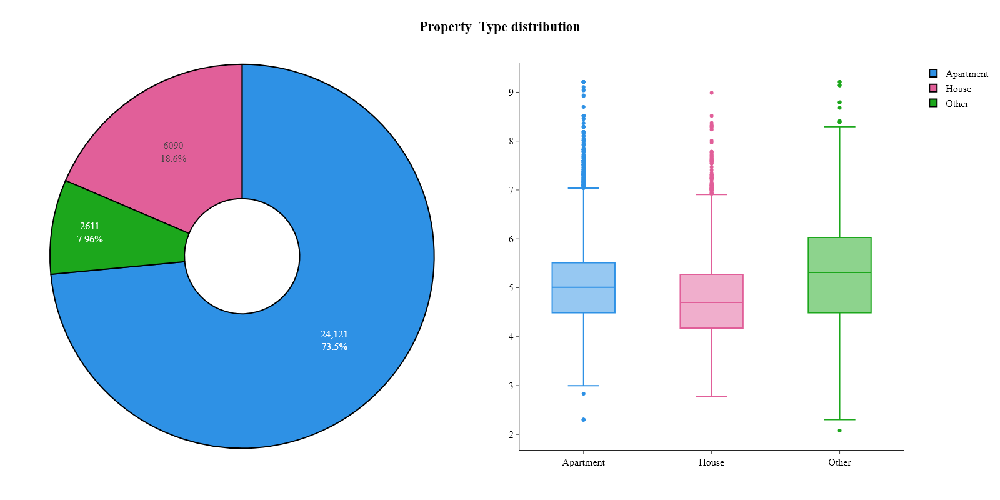

In [57]:
plots.pie_boxplot_by_categorical(listings, "property_type", "log_price", name="property_type")

**Notes:**
- The most common 'group' of property type is 'Apartment'.
- The median `log_price` is higher for 'Apartment' than for 'House'.

**Conclusion:**
- I will use One-Hot Encoding to convert the `property_type` variable into a numerical format.

In [58]:
listings = pd.get_dummies(listings, columns=['property_type'], drop_first=False)
listings.drop(['property_type_Other'], axis=1, inplace=True)

## `room_type`

`room_type` - the type of room that is being listed.

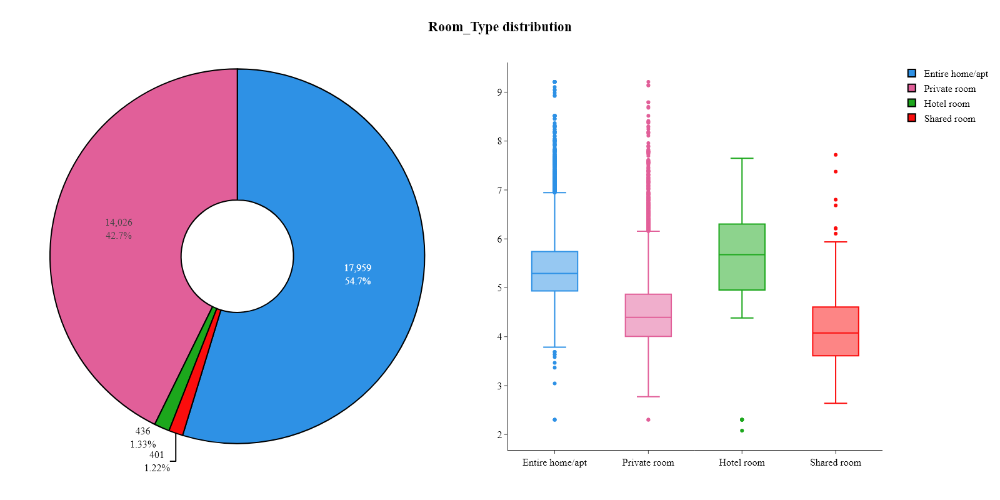

In [59]:
plots.pie_boxplot_by_categorical(listings, "room_type", "log_price", name="room_type")

**Notes:**
- 'Shared room' and 'Hotel room' are much less common than 'Entire home/apt' and 'Private room', however the difference between the median price between 'Shared room' and 'Hotel room' is significant so it is worth to keep them as separate categories instead of grouping them into 'Other'.
- For 'Entire home/apt' and 'Hotel room' the median `log_price` is higher than for 'Private room' and 'Shared room'.

**Conclusion:**
- I will use One-Hot Encoding to convert the `room_type` variable into a numerical format.

In [60]:
listings = pd.get_dummies(listings, columns=['room_type'], drop_first=False)
listings.drop(['room_type_Shared room'], axis=1, inplace=True)

## `accommodates`

`accommodates` - The maximum capacity of the listing

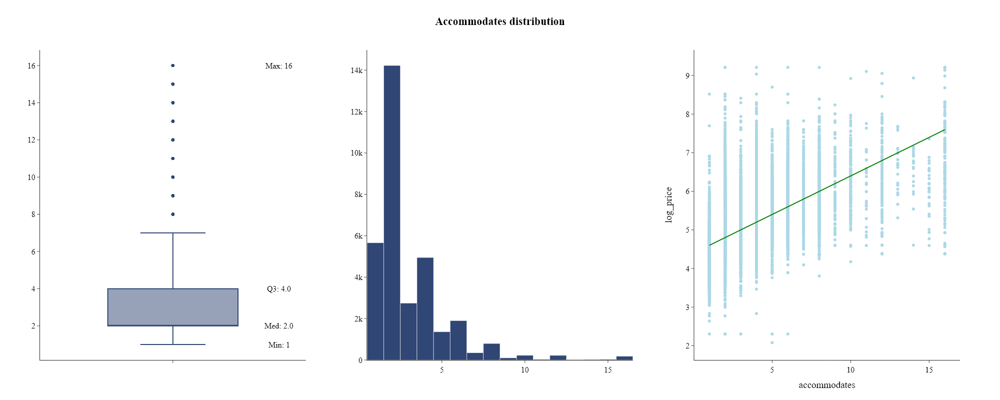

In [61]:
plots.histogram_boxplot_linear_regression(listings, "accommodates", "log_price", name="accommodates", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The distribution of the `accommodates` variable is right-skewed, but due to the fact that is is a discrete variable, I will not apply any transformation (PYTANIE: może jednak warto? Tylko jaką?).
- It seems that the listings which can accommodate more people have on average higher `log_price`.

## `bedrooms`

`bedrooms` - the number of bedrooms in the listing.

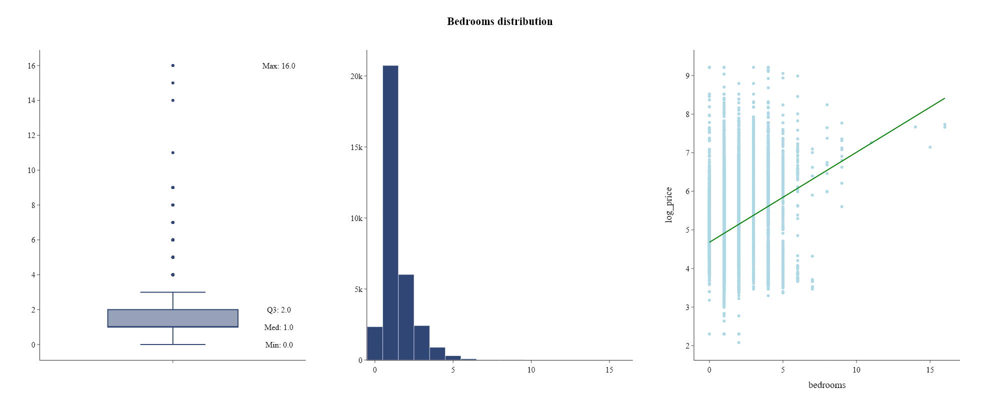

In [62]:
plots.histogram_boxplot_linear_regression(listings, "bedrooms", "log_price", name="bedrooms", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The median value of the `bedrooms` variable is 1.
- The more bedrooms the listing has, the higher the `log_price`.

PYTANIE: czy warto zrobić pierwiastek tej zmiennej?

## `beds`

`beds` - the number of beds in the listing.

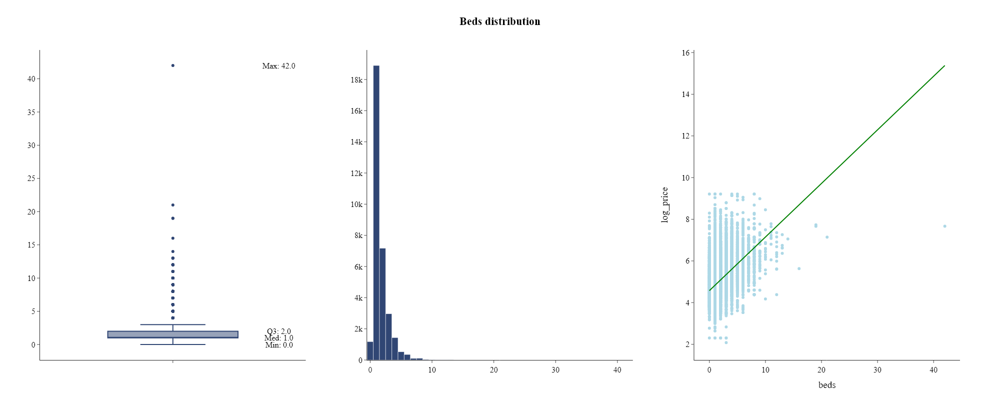

In [63]:
plots.histogram_boxplot_linear_regression(listings, "beds", "log_price", name="beds", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)

**Notes:**
- The distribution of `beds` variable is very similar to the distribution of `bedrooms` variable with the median value equal to 1.
- The more beds the listing has, the higher the `log_price`.

PYTANIE: czy warto zrobić pierwiastek tej zmiennej?

## `bathrooms_number`

`bathrooms_number` - the number of bathrooms in the listing.

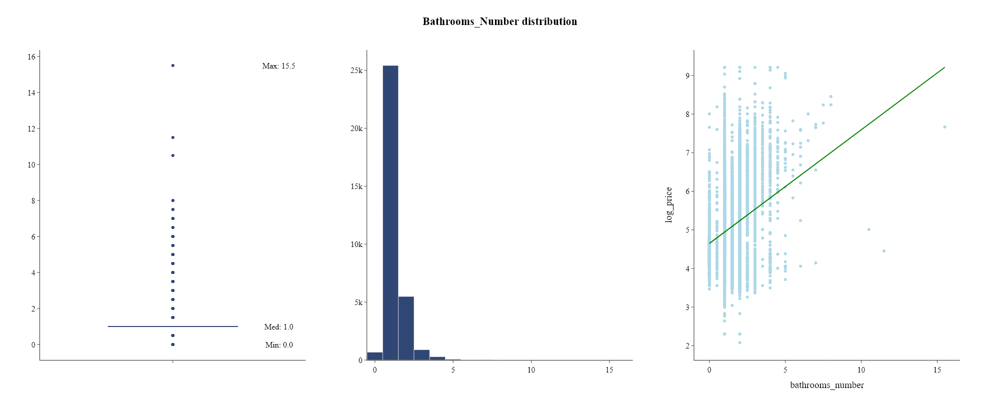

In [64]:
plots.histogram_boxplot_linear_regression(listings, "bathrooms_number", "log_price", name="bathrooms_number", annotations=["Min", "Med", "Max"], bin_size=1)

**Notes:**
- The distribution of the `bathrooms_number` variable is right-skewed.
- The more bathrooms the listing has, the higher the median `log_price`.

PYTANIE: czy warto zrobić pierwiastek tej zmiennej?

## `is_bathroom_shared`

`is_bathroom_shared` - whether the bathroom is shared or not.

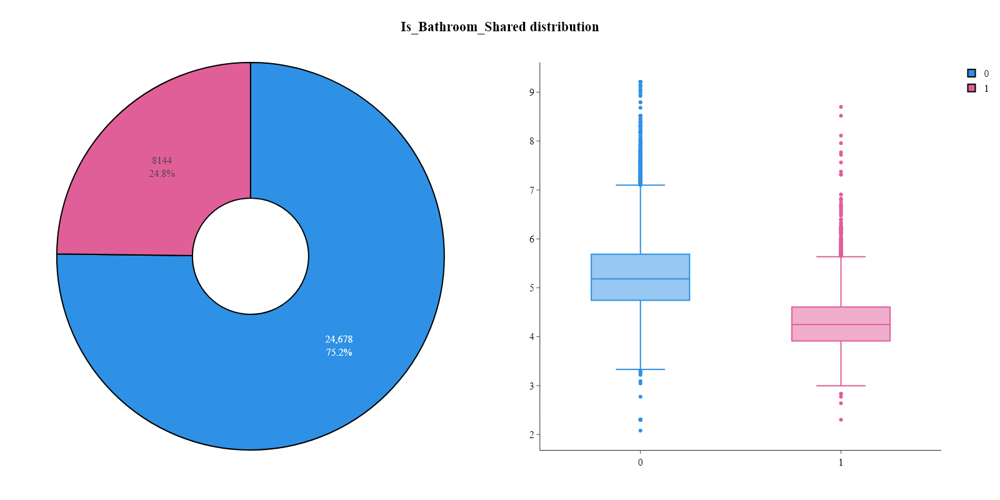

In [65]:
plots.pie_boxplot_by_categorical(listings, "is_bathroom_shared", "log_price", name="is_bathroom_shared")

**Notes:**
- `is_bathroom_shared` is a binary variable.
- Majority of the listings have a private bathroom.
- It seems that the listings for which the bathroom is shared have on average lower `log_price`.

## `amenities`

`amenities` - a list of amenities that the listing includes.

In [66]:
listings["amenities_cleaned"] = listings["amenities"].str.replace(r"[\"{}\[\]\\u]", "", regex=True).str.strip()
listings["amenities_cleaned"] = listings["amenities_cleaned"].str.split(", ")
top_10_amenities = listings.explode("amenities_cleaned").groupby(["amenities_cleaned"]).size().sort_values(ascending=False).head(10).reset_index().rename(columns={"amenities_cleaned": "Amenity", 0: "Count"})
print("Top 10 amenities:\n", top_10_amenities)
print("\nNumber of unique amenities:", listings.explode("amenities_cleaned")["amenities_cleaned"].nunique())

Top 10 amenities:
                  Amenity  Count
0            Smoke alarm  29487
1                   Wifi  29123
2                Kitchen  26809
3  Carbon monoxide alarm  26789
4              Hot water  24080
5             Essentials  23328
6                Hangers  22321
7  Dishes and silverware  21231
8                   Iron  20499
9       Air conditioning  20486

Number of unique amenities: 5591


Due to the fact that there are plenty of amenities in the `amenities_cleaned` variable, I will not investigate them one by one, but choose the most common ones and create new binary columns for them.

The scheme of finding most common amenities is as follows:

1. Calculate occurence of each unique amenity per borough.
2. Extract only those amenities which occured in at least 30% of the listings in EACH borough.
3. Create binary column 

1. Calculate occurence of each unique amenity per borough.

In [67]:
amenities_grouped = listings.explode("amenities_cleaned").groupby(["borough", "amenities_cleaned"]).size().unstack(fill_value=0)
amenities_percentage = amenities_grouped.div(listings["borough"].value_counts(), axis=0).transpose()
top_amenities = {key: amenities_percentage[key].sort_values(ascending=False).head(10) for key in amenities_percentage.columns}
top_amenities_df = pd.DataFrame(top_amenities)
top_amenities_df.style.background_gradient(cmap='Blues')

,Bronx,Brooklyn,Manhattan,Queens,Staten Island
amenities_cleaned,,,,,
Air conditioning,nan,nan,0.694685,nan,nan
Carbon monoxide alarm,0.860750,0.837727,0.788361,0.829057,0.914634
Cooking basics,0.645754,0.625388,nan,nan,nan
Dishes and silverware,0.694721,0.668531,nan,0.671040,0.731707
Essentials,0.742923,0.693209,0.732824,0.674706,0.756098
Hair dryer,nan,nan,0.644061,0.632645,nan
Hangers,0.676358,0.649356,0.694071,0.702489,0.751220
Hot water,0.732976,0.720373,0.745241,0.727185,0.768293
Iron,0.684774,nan,0.639149,nan,0.660976


2. Extract only those amenities which occured in at least 30% of the listings in EACH borough.

In [68]:
percentage_threshold = 0.5
filtered_amenities = {key: value[value >= percentage_threshold].index for key, value in amenities_percentage.items()}
filtered_amenities = set.intersection(*[set(value) for value in filtered_amenities.values()])
print(f"Amenities which occured at least in {percentage_threshold*100}% of listings in each borough:\n{list(filtered_amenities)}")

Amenities which occured at least in 50.0% of listings in each borough:
['Microwave', 'Refrigerator', 'Iron', 'Hot water', 'Smoke alarm', 'Bed linens', 'Dedicated workspace', 'Dishes and silverware', 'Carbon monoxide alarm', 'Wifi', 'Hangers', 'Cooking basics', 'Essentials', 'Air conditioning', 'Hair dryer', 'Kitchen']


In [69]:
amenities_df = pd.DataFrame(amenities_percentage)
filtered_amenities_df = amenities_df.loc[list(filtered_amenities)]
filtered_amenities_df.style.background_gradient(cmap='Blues')

borough,Bronx,Brooklyn,Manhattan,Queens,Staten Island
amenities_cleaned,,,,,
Microwave,0.643458,0.556414,0.538446,0.623191,0.682927
Refrigerator,0.618975,0.650244,0.574060,0.631102,0.643902
Iron,0.684774,0.596804,0.639149,0.625506,0.660976
Hot water,0.732976,0.720373,0.745241,0.727185,0.768293
Smoke alarm,0.925019,0.907767,0.887494,0.898321,0.946341
Bed linens,0.598317,0.569197,0.629460,0.594250,0.646341
Dedicated workspace,0.591431,0.615535,0.599577,0.589427,0.580488
Dishes and silverware,0.694721,0.668531,0.614996,0.671040,0.731707
Carbon monoxide alarm,0.860750,0.837727,0.788361,0.829057,0.914634


3. Create binary column for each of the most common amenities.

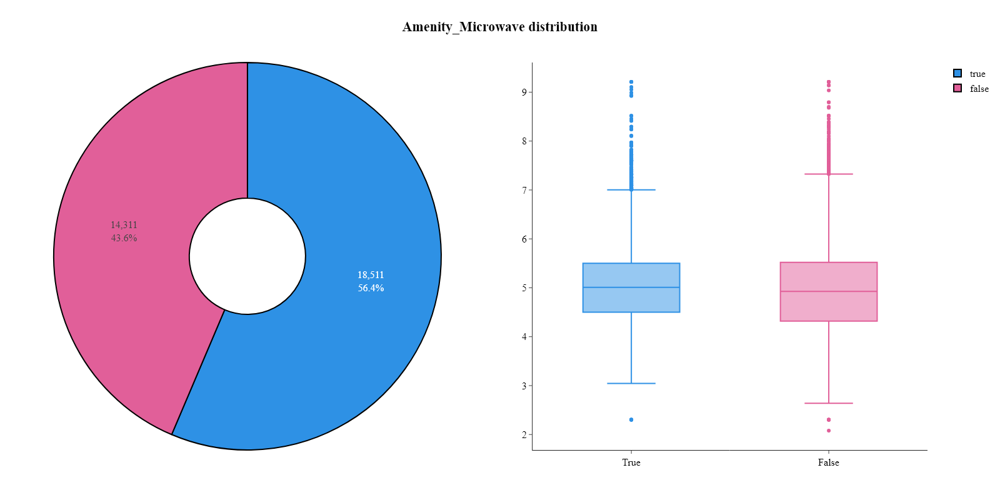

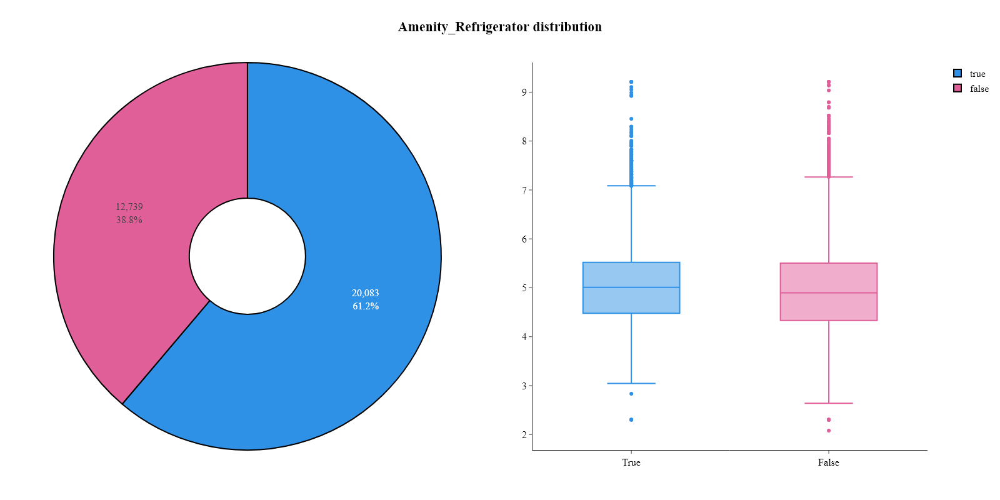

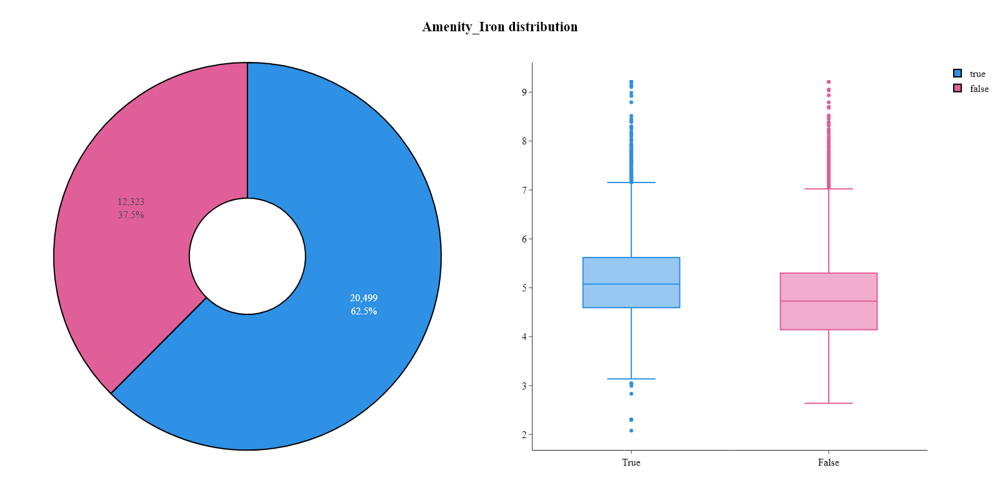

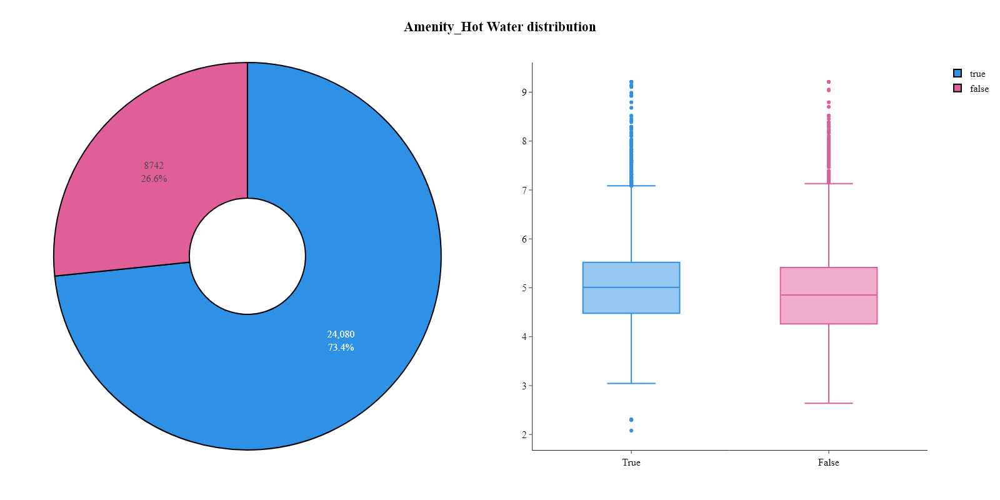

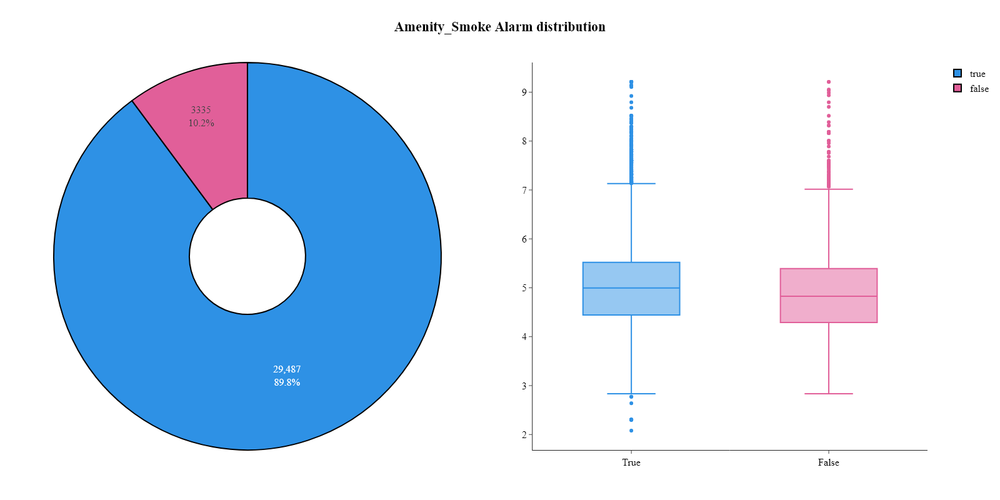

...

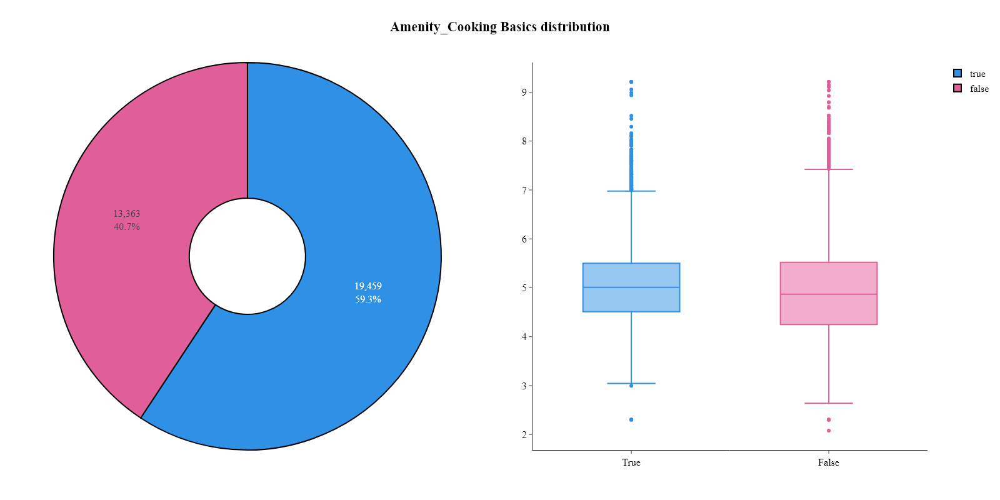

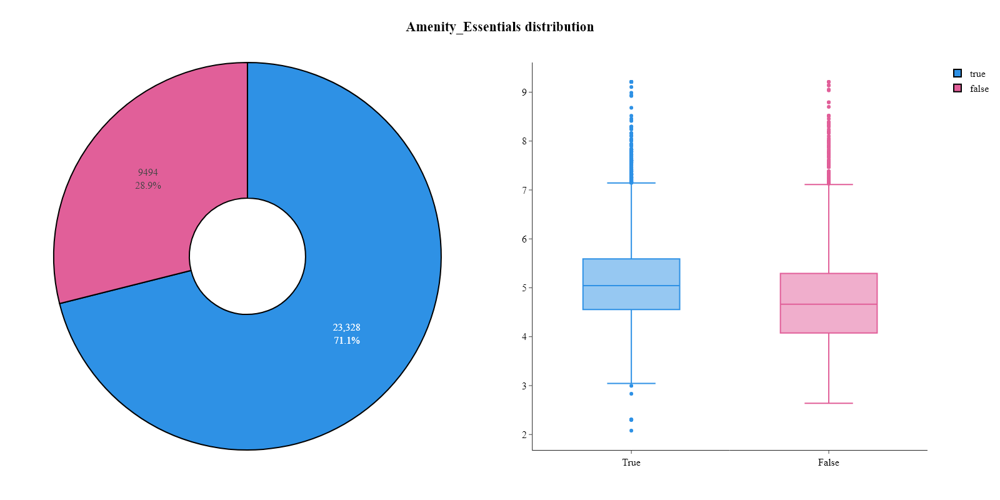

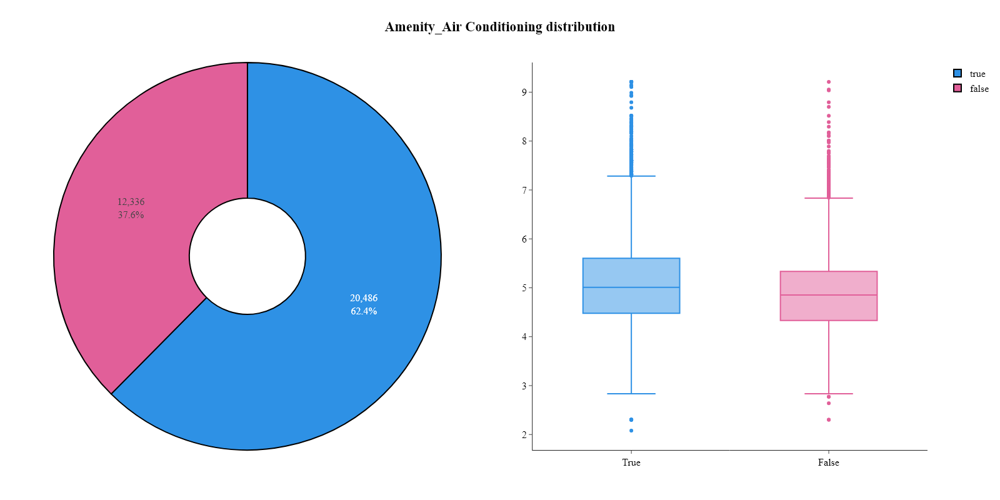

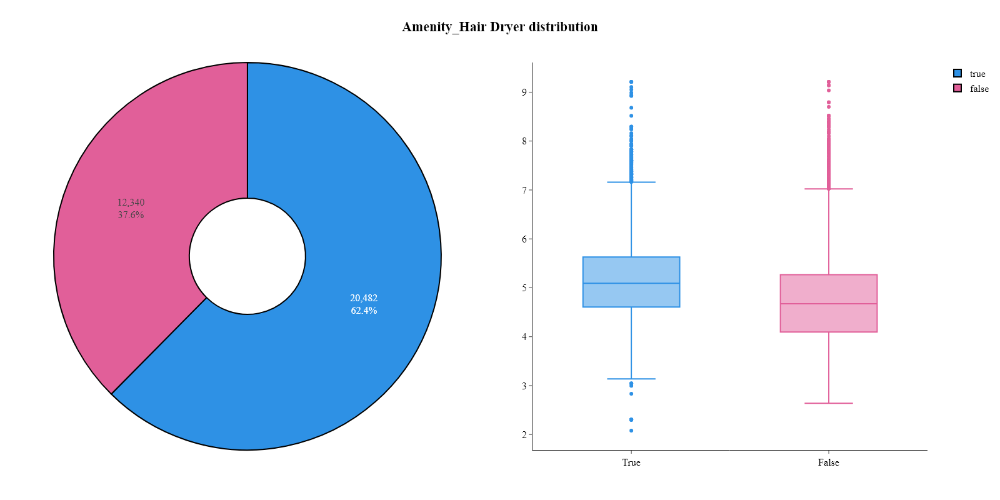

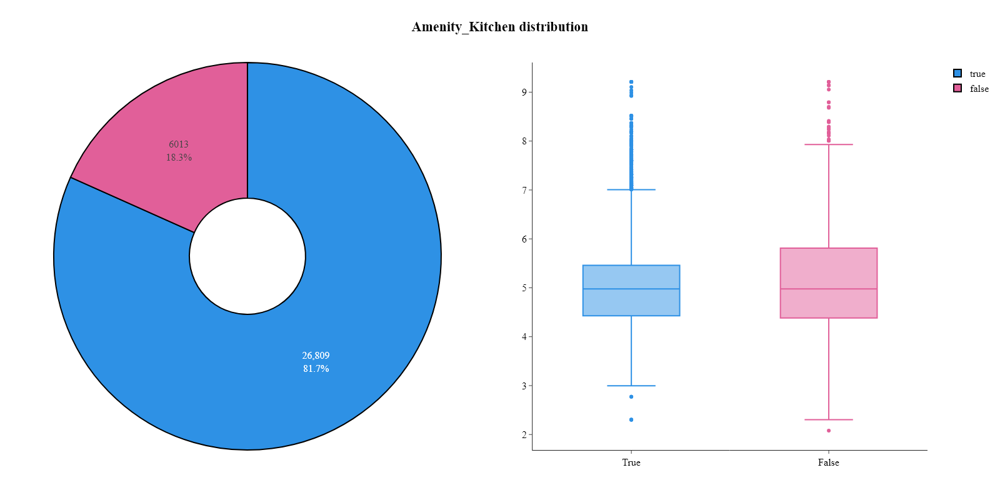

In [70]:
for amenity in filtered_amenities:
    listings[f"amenity_{amenity}"] = listings["amenities_cleaned"].apply(lambda x: 1 if amenity in x else 0).astype(bool)
    plots.pie_boxplot_by_categorical(listings, f"amenity_{amenity}", "log_price", name=f"amenity_{amenity}")

**Notes:**
- There are no huge differences in the median `log_price` between listings with and without the most common amenities.
- It seems that some of the most influential amenities are: Hair dryer, Iron and Essentials, however the difference in median `log_price` is not significant.

We will also create a new feature `number_of_amenities` which will represent the total number of amenities that the listing includes.

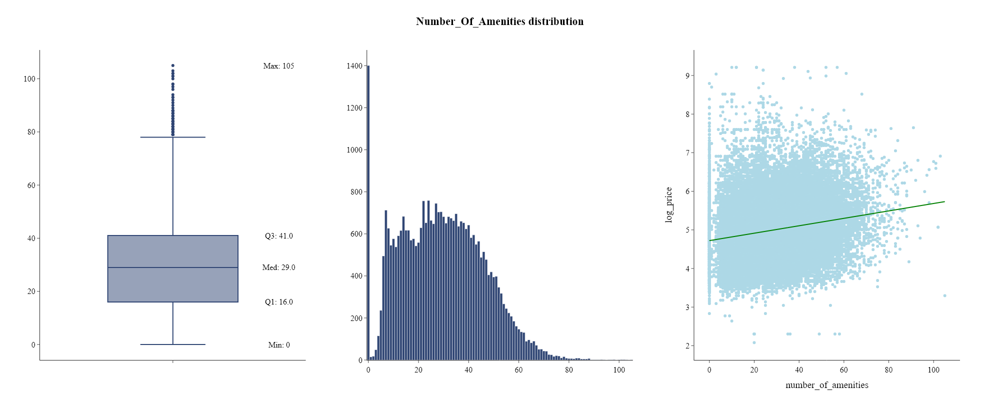

In [71]:
listings['number_of_amenities'] = listings['amenities_cleaned'].apply(lambda x: len(x) if x[0] else 0)
plots.histogram_boxplot_linear_regression(listings, "number_of_amenities", "log_price", name="number_of_amenities", annotations=True, bin_size=1)

**Notes:**
- Maximum number of amenities is 105, while the median is 29.
- From the linear relationship plot between `number_of_amenities` and `log_price` we can see that there is a slight positive linear relationship between the number of amenities and the price of the listing.

**Conclusion:**
- I will drop `amenities` and `amenities_cleaned`, `borough` variables from the dataset and I will use the `number_of_amenities` variable instead. 

PYTANIE: może warto ją zostawić i utworzyć kolumny dla najczęściej występujących. Ale nie brać jedynie pod uwagę ogólnej liczby wystąpień, tylko z podziałem na każdą z dzielnic ("borough").

In [72]:
listings.drop(['amenities', 'amenities_cleaned', 'borough'], axis=1, inplace=True)

# Customer reviews

## `number_of_reviews`, `number_of_reviews_ltm`, `number_of_reviews_l30d`

`number_of_reviews` - the number of reviews that the listing has.

`number_of_reviews_ltm` - the number of reviews that the listing has in the last twelve months.

`number_of_reviews_l30d` - the number of reviews that the listing has in the last 30 days.

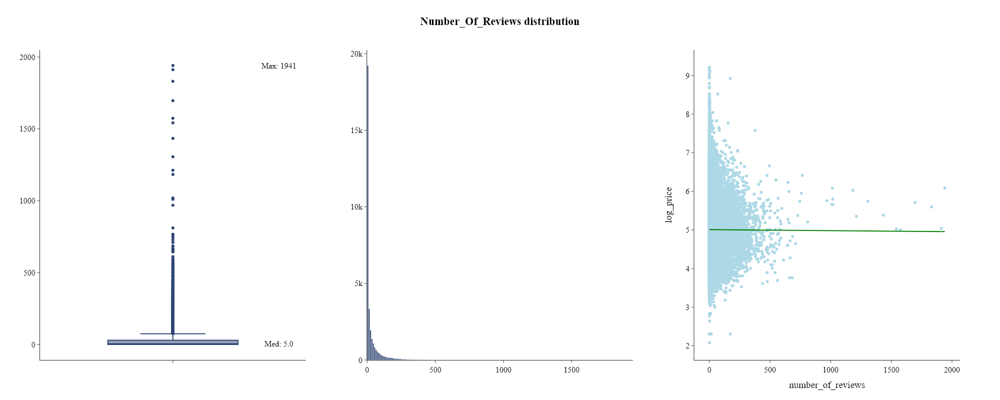

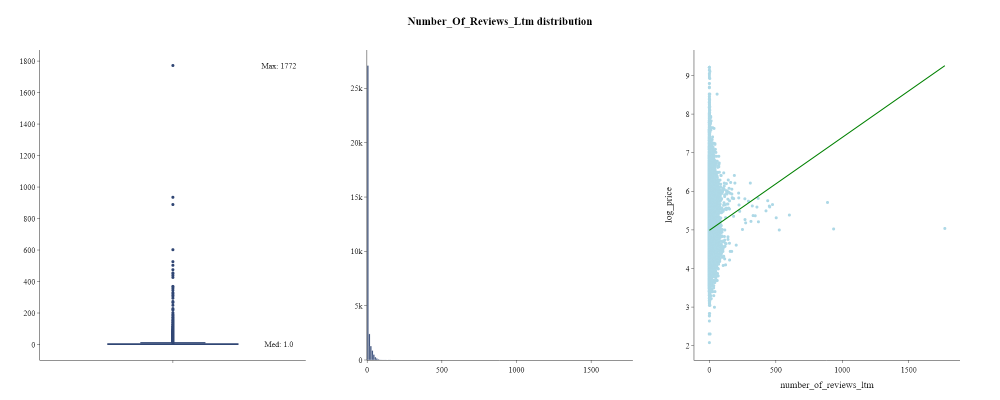

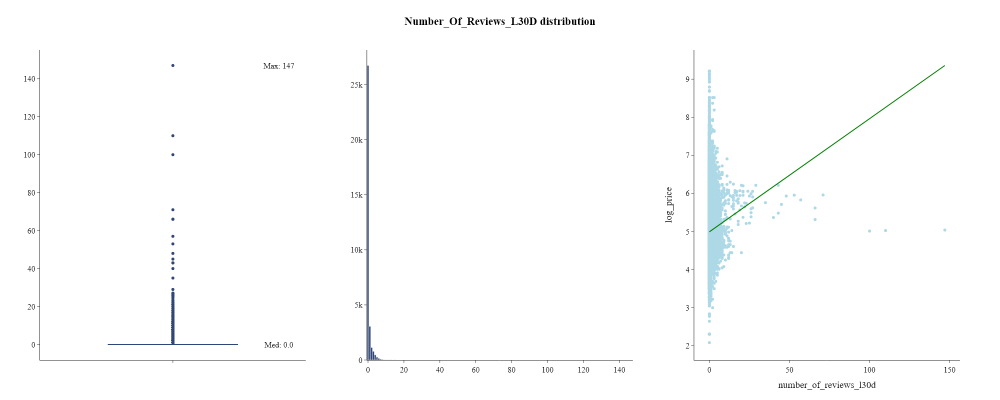

In [73]:
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews", "log_price", name="number_of_reviews", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews_ltm", "log_price", name="number_of_reviews_ltm", annotations=["Med", "Max"], bin_size=10)
plots.histogram_boxplot_linear_regression(listings, "number_of_reviews_l30d", "log_price", name="number_of_reviews_l30d", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- All three variables are right-skewed.

**Conclusion:**
- I will apply a square root transformation (unable to apply log transformation due to 0 values) to the `number_of_reviews`, `number_of_reviews_ltm` and `number_of_reviews_l30d` variables to make them more normally distributed.

In [74]:
listings['root_number_of_reviews'] = np.sqrt(listings['number_of_reviews'])
listings['root_number_of_reviews_ltm'] = np.sqrt(listings['number_of_reviews_ltm'])
listings['root_number_of_reviews_l30d'] = np.sqrt(listings['number_of_reviews_l30d'])
listings.drop(['number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d'], axis=1, inplace=True)

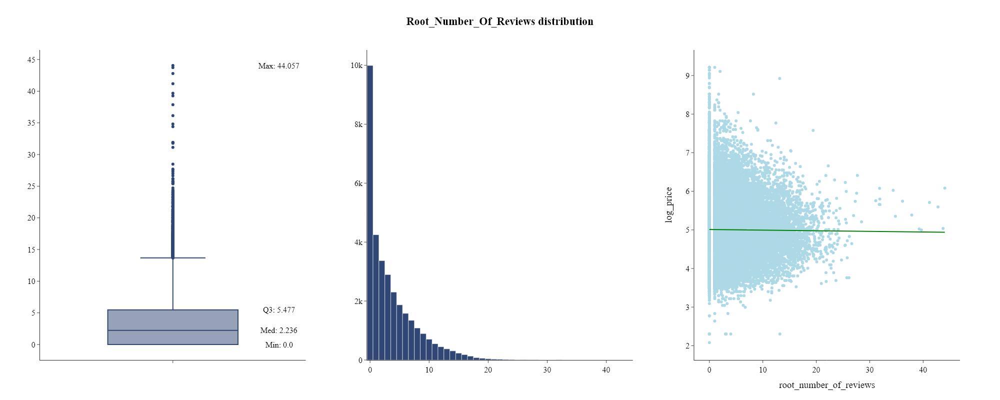

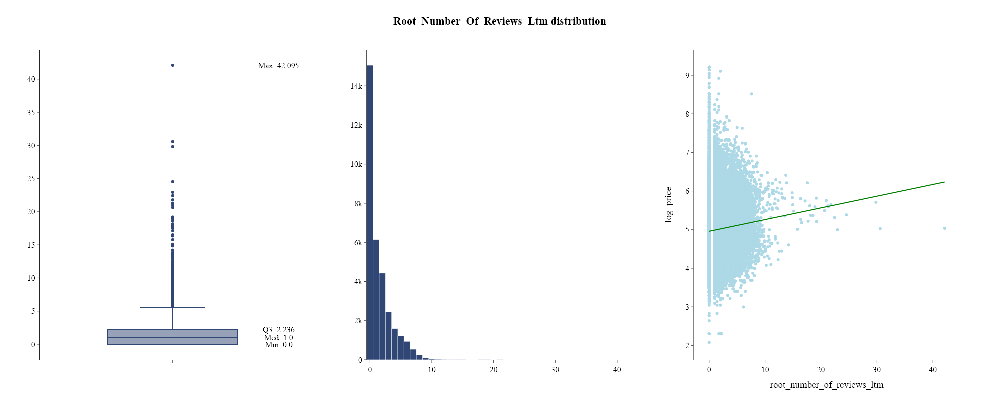

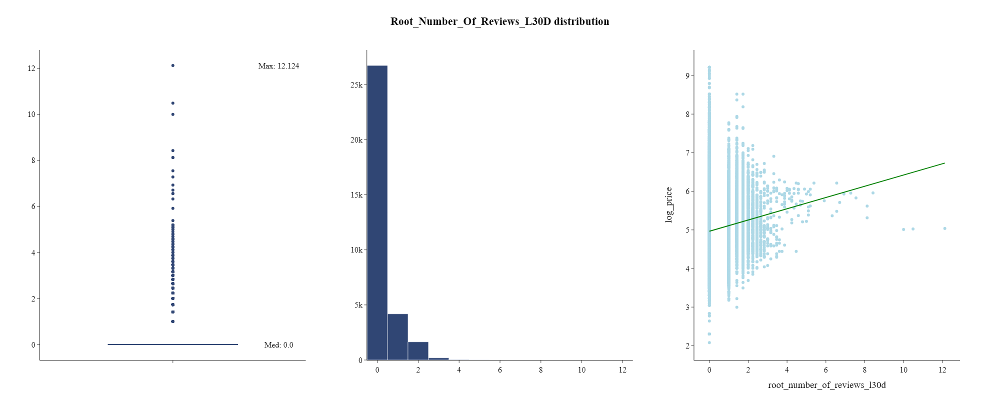

In [75]:
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews", "log_price", name="root_number_of_reviews", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews_ltm", "log_price", name="root_number_of_reviews_ltm", annotations=["Min", "Med", "Q3", "Max"], bin_size=1)
plots.histogram_boxplot_linear_regression(listings, "root_number_of_reviews_l30d", "log_price", name="root_number_of_reviews_l30d", annotations=["Med", "Max"], bin_size=1)

**Notes:**
- After applying the square root transformation, the distributions of the `number_of_reviews`, `number_of_reviews_ltm` and `number_of_reviews_l30d` are still right-skewed, but the skewness is lower than before.

## `time_since_first_review`

`time_since_first_review` - the number of days since the first review of the listing.

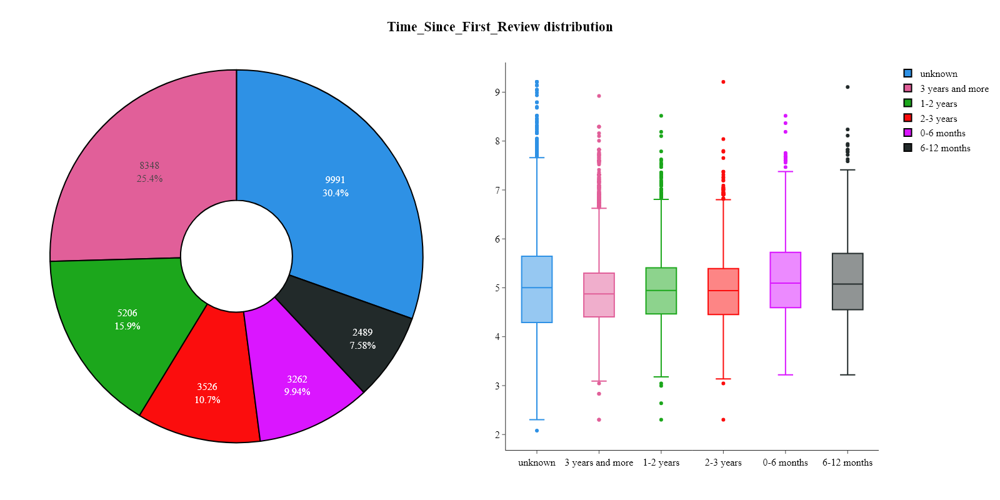

In [76]:
plots.pie_boxplot_by_categorical(listings, "time_since_first_review", "log_price", name="time_since_first_review")

**Notes:**
- The frequency of each category is very similar.
- There is no clear relationship between `time_since_first_review` and `log_price`.

**Conclusion:**
- I will use One-Hot Encoding to convert the `time_since_first_review` variable into a numerical format.

In [77]:
listings = pd.get_dummies(listings, columns=['time_since_first_review'], drop_first=False)
listings.drop(['time_since_first_review_unknown'], axis=1, inplace=True)

## `time_since_last_review`

`time_since_last_review` - the number of days since the last review of the listing.

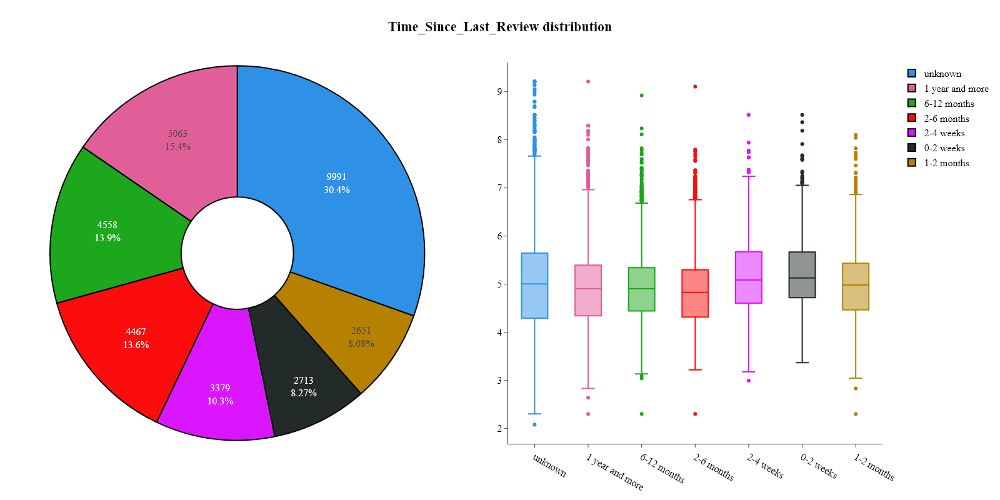

In [78]:
plots.pie_boxplot_by_categorical(listings, "time_since_last_review", "log_price", name="time_since_last_review")

**Notes:**
- The least common category is '6-12 months'.
- Similarly to the `time_since_first_review` variable, there is no clear relationship between `time_since_last_review` and `log_price`.

**Conclusion:**
- I will use One-Hot Encoding to convert the `time_since_last_review` variable into a numerical format.

In [79]:
listings = pd.get_dummies(listings, columns=['time_since_last_review'], drop_first=False)
listings.drop(['time_since_last_review_unknown'], axis=1, inplace=True)

## review ratings columns

`review_scores_rating` - the average rating of the listing.

`review_scores_accuracy` - the accuracy of the listing.

`review_scores_cleanliness` - the cleanliness of the listing.

`review_scores_checkin` - the check-in process of the listing.

`review_scores_communication` - the communication of the listing.

`review_scores_location` - the location of the listing.

`review_scores_value` - the value of the listing.

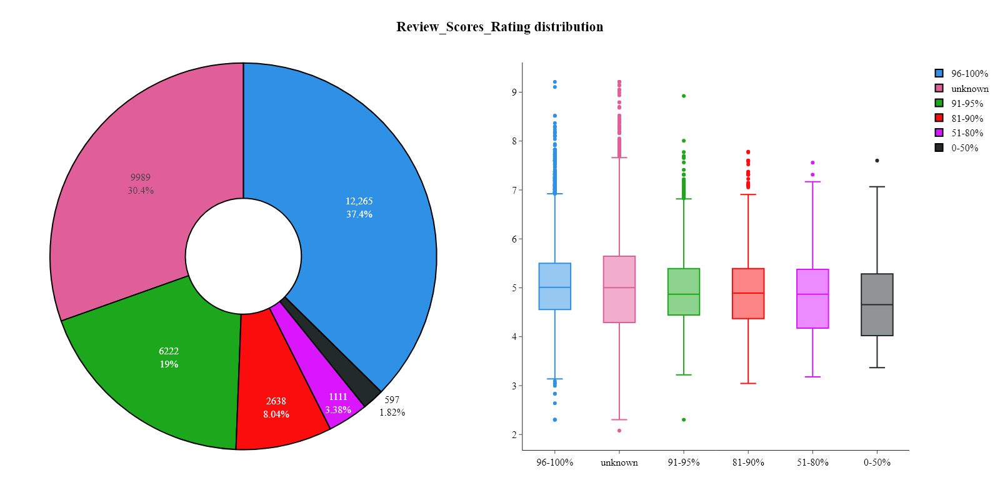

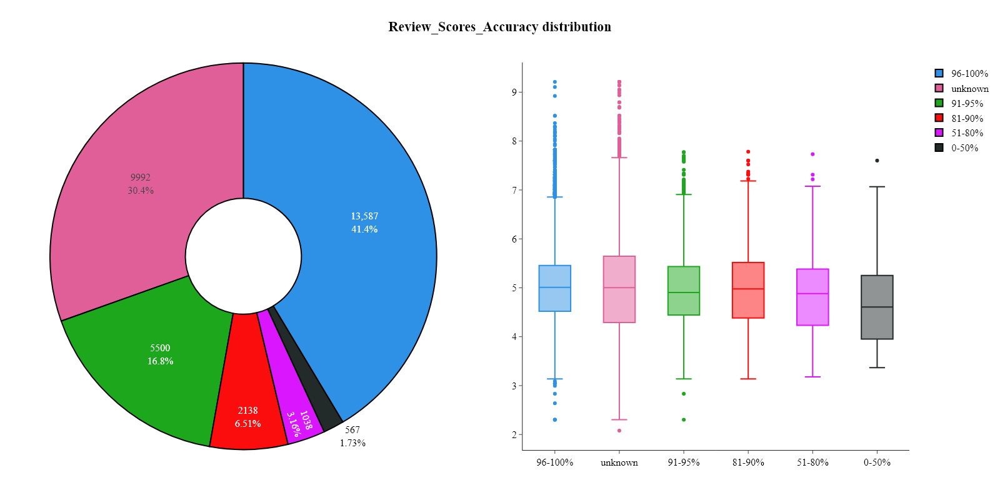

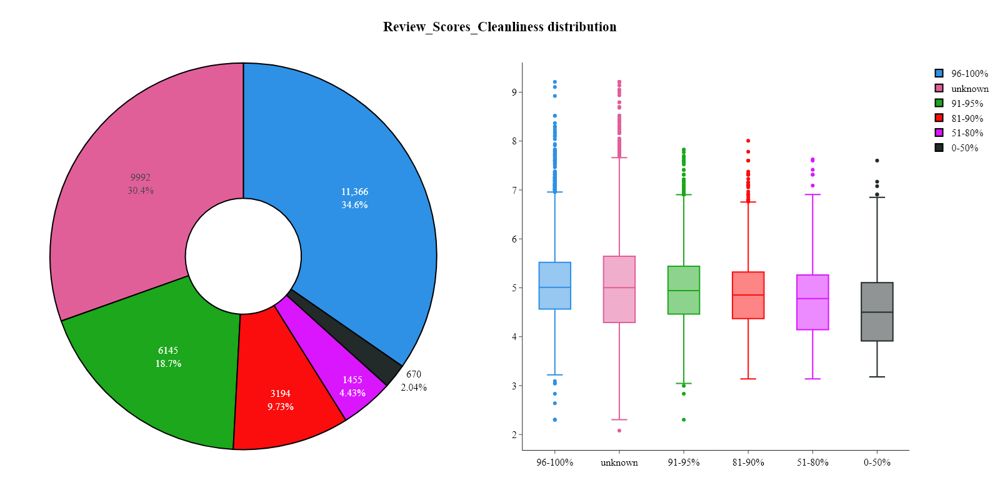

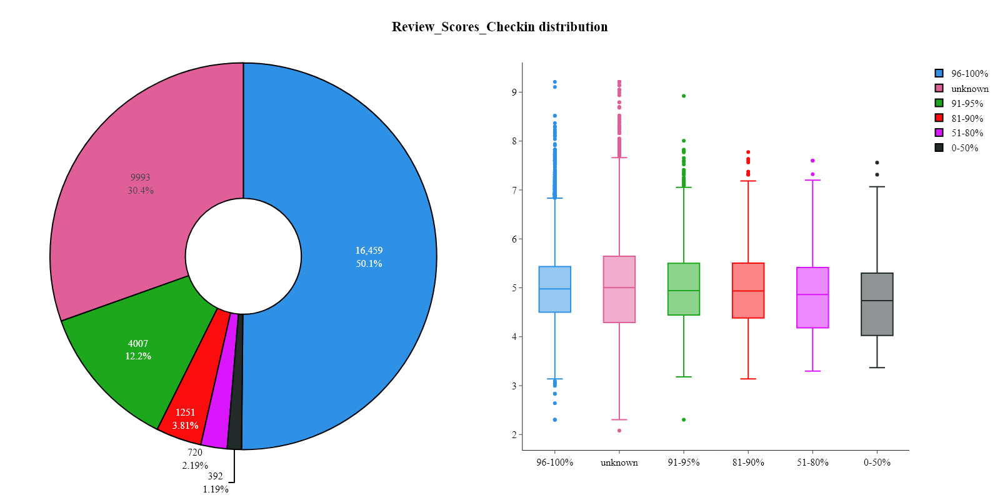

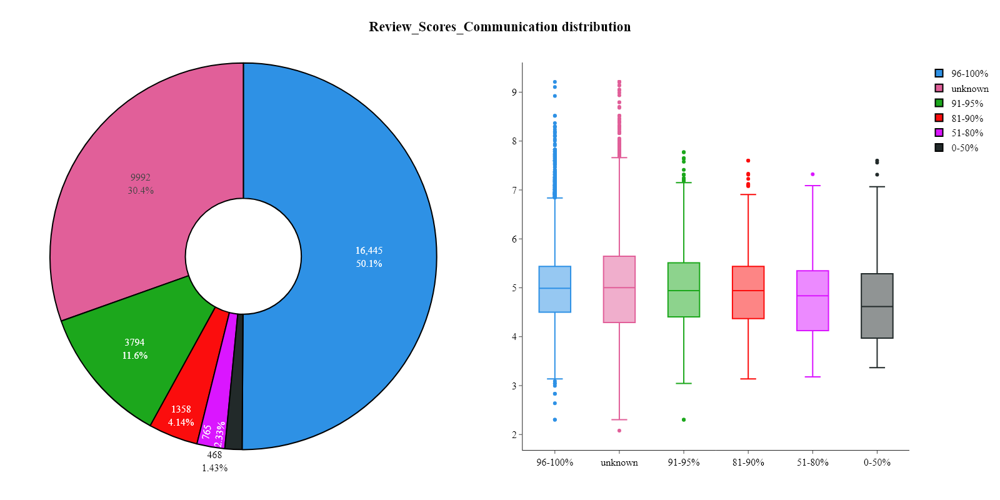

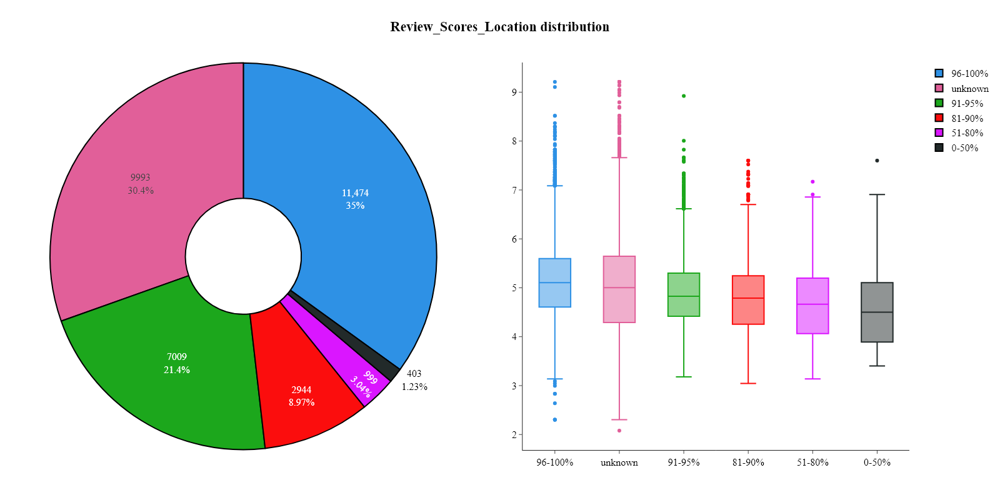

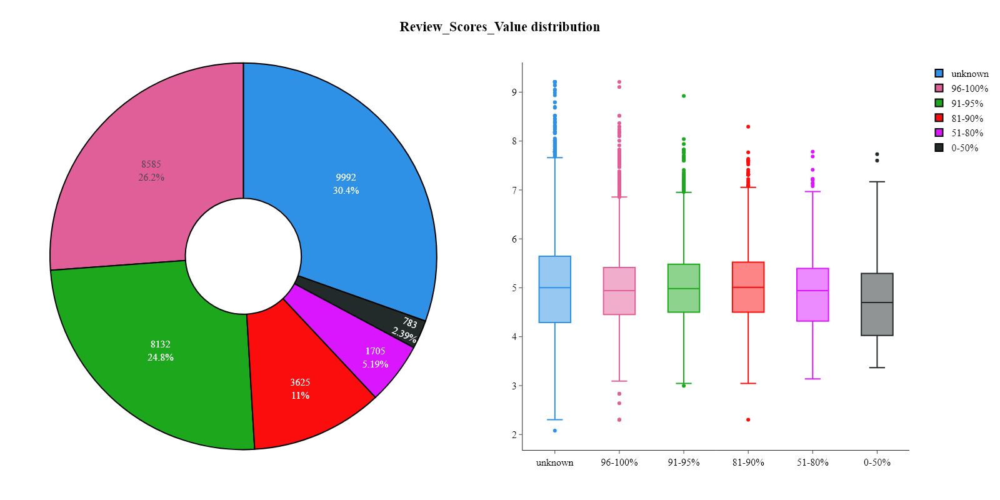

In [80]:
plots.pie_boxplot_by_categorical(listings, "review_scores_rating", "log_price", name="review_scores_rating")
plots.pie_boxplot_by_categorical(listings, "review_scores_accuracy", "log_price", name="review_scores_accuracy")
plots.pie_boxplot_by_categorical(listings, "review_scores_cleanliness", "log_price", name="review_scores_cleanliness")
plots.pie_boxplot_by_categorical(listings, "review_scores_checkin", "log_price", name="review_scores_checkin")
plots.pie_boxplot_by_categorical(listings, "review_scores_communication", "log_price", name="review_scores_communication")
plots.pie_boxplot_by_categorical(listings, "review_scores_location", "log_price", name="review_scores_location")
plots.pie_boxplot_by_categorical(listings, "review_scores_value", "log_price", name="review_scores_value")

**Notes:**
- For most variables related to review scores, the most commont 'bucket' is 96-100%.
- There is no clear relationship between the review scores and the price of the listing (at least in terms of median `log_price`).

**Conclusion:**
- I will apply One-Hot Encoding to convert the categorical variables related to review scores into a numerical format.

In [81]:
listings = pd.get_dummies(listings, columns=['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value'], drop_first=False)
listings.drop(['review_scores_rating_unknown', 'review_scores_accuracy_unknown', 'review_scores_cleanliness_unknown', 'review_scores_checkin_unknown', 'review_scores_communication_unknown', 'review_scores_location_unknown', 'review_scores_value_unknown'], axis=1, inplace=True)

## Summary

In [82]:
base_information(listings)

,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
listing_id,int64,0,0.000000,32822,32822
listing_url,object,0,0.000000,32822,32822
host_is_superhost,bool,0,0.000000,2,32822
host_has_profile_pic,bool,0,0.000000,2,32822
host_identity_verified,bool,0,0.000000,2,32822
accommodates,int64,0,0.000000,16,32822
bedrooms,float64,0,0.000000,14,32822
beds,float64,0,0.000000,19,32822
minimum_nights,int64,0,0.000000,23,32822
maximum_nights,int64,0,0.000000,223,32822


I will not use columns related with amenities for now.

In [83]:
listings = listings.loc[:,~listings.columns.str.startswith('amenity')]

Due to the fact that MySQL accepts only names without special characters, therefore I will change the names of the columns to be more MySQL-friendly.

In [84]:
listings.columns = listings.columns.str.replace(r'[\s/-]', '_', regex=True)
listings.columns = listings.columns.str.replace('%', '', regex=True)

# Save listings after EDA to DB

In [85]:
table_name = "listings_eda"
drop_table_script = f"""
DROP TABLE IF EXISTS {table_name};
"""
cursor.execute(drop_table_script)

In [86]:
create_script = f"""
CREATE TABLE IF NOT EXISTS {table_name} (
    listing_id BIGINT PRIMARY KEY NOT NULL,
    listing_url VARCHAR(255) NOT NULL,
    host_is_superhost BOOLEAN NOT NULL,
    host_has_profile_pic BOOLEAN NOT NULL,
    host_identity_verified BOOLEAN NOT NULL,
    accommodates FLOAT NOT NULL,
    bedrooms FLOAT NOT NULL,
    beds FLOAT NOT NULL,
    minimum_nights FLOAT NOT NULL,
    maximum_nights FLOAT NOT NULL,
    availability_30 FLOAT NOT NULL,
    availability_365 FLOAT NOT NULL,
    instant_bookable BOOLEAN NOT NULL,
    geometry TEXT NOT NULL,
    bathrooms_number FLOAT NOT NULL,
    is_bathroom_shared BOOLEAN NOT NULL,
    log_price FLOAT NOT NULL,
    days_since_host FLOAT NOT NULL,
    host_response_time_a_few_days_or_more BOOLEAN NOT NULL,
    host_response_time_within_a_day BOOLEAN NOT NULL,
    host_response_time_within_a_few_hours BOOLEAN NOT NULL,
    host_response_time_within_an_hour BOOLEAN NOT NULL,
    host_response_rate_0_50 BOOLEAN NOT NULL,
    host_response_rate_100 BOOLEAN NOT NULL,
    host_response_rate_51_90 BOOLEAN NOT NULL,
    host_response_rate_91_99 BOOLEAN NOT NULL,
    host_acceptance_rate_0_50 BOOLEAN NOT NULL,
    host_acceptance_rate_100 BOOLEAN NOT NULL,
    host_acceptance_rate_51_90 BOOLEAN NOT NULL,
    host_acceptance_rate_91_99 BOOLEAN NOT NULL,
    log_host_listings_count FLOAT NOT NULL,
    root_calculated_host_listings_count_entire_homes FLOAT NOT NULL,
    root_calculated_host_listings_count_private_rooms FLOAT NOT NULL,
    root_calculated_host_listings_count_shared_rooms FLOAT NOT NULL,
    host_verification_email BOOLEAN NOT NULL,
    host_verification_phone BOOLEAN NOT NULL,
    host_verification_work_email BOOLEAN NOT NULL,
    host_verification_count FLOAT NOT NULL,
    property_type_Apartment BOOLEAN NOT NULL,
    property_type_House BOOLEAN NOT NULL,
    room_type_Entire_home_apt BOOLEAN NOT NULL,
    room_type_Hotel_room BOOLEAN NOT NULL,
    room_type_Private_room BOOLEAN NOT NULL,
    number_of_amenities FLOAT NOT NULL,
    root_number_of_reviews FLOAT NOT NULL,
    root_number_of_reviews_ltm FLOAT NOT NULL,
    root_number_of_reviews_l30d FLOAT NOT NULL,
    time_since_first_review_0_6_months BOOLEAN NOT NULL,
    time_since_first_review_1_2_years BOOLEAN NOT NULL,
    time_since_first_review_2_3_years BOOLEAN NOT NULL,
    time_since_first_review_3_years_and_more BOOLEAN NOT NULL,
    time_since_first_review_6_12_months BOOLEAN NOT NULL,
    time_since_last_review_0_2_weeks BOOLEAN NOT NULL,
    time_since_last_review_1_year_and_more BOOLEAN NOT NULL,
    time_since_last_review_1_2_months BOOLEAN NOT NULL,
    time_since_last_review_2_4_weeks BOOLEAN NOT NULL,
    time_since_last_review_2_6_months BOOLEAN NOT NULL,
    time_since_last_review_6_12_months BOOLEAN NOT NULL,
    review_scores_rating_0_50 BOOLEAN NOT NULL,
    review_scores_rating_51_80 BOOLEAN NOT NULL,
    review_scores_rating_81_90 BOOLEAN NOT NULL,
    review_scores_rating_91_95 BOOLEAN NOT NULL,
    review_scores_rating_96_100 BOOLEAN NOT NULL,
    review_scores_accuracy_0_50 BOOLEAN NOT NULL,
    review_scores_accuracy_51_80 BOOLEAN NOT NULL,
    review_scores_accuracy_81_90 BOOLEAN NOT NULL,
    review_scores_accuracy_91_95 BOOLEAN NOT NULL,
    review_scores_accuracy_96_100 BOOLEAN NOT NULL,
    review_scores_cleanliness_0_50 BOOLEAN NOT NULL,
    review_scores_cleanliness_51_80 BOOLEAN NOT NULL,
    review_scores_cleanliness_81_90 BOOLEAN NOT NULL,
    review_scores_cleanliness_91_95 BOOLEAN NOT NULL,
    review_scores_cleanliness_96_100 BOOLEAN NOT NULL,
    review_scores_checkin_0_50 BOOLEAN NOT NULL,
    review_scores_checkin_51_80 BOOLEAN NOT NULL,
    review_scores_checkin_81_90 BOOLEAN NOT NULL,
    review_scores_checkin_91_95 BOOLEAN NOT NULL,
    review_scores_checkin_96_100 BOOLEAN NOT NULL,
    review_scores_communication_0_50 BOOLEAN NOT NULL,
    review_scores_communication_51_80 BOOLEAN NOT NULL,
    review_scores_communication_81_90 BOOLEAN NOT NULL,
    review_scores_communication_91_95 BOOLEAN NOT NULL,
    review_scores_communication_96_100 BOOLEAN NOT NULL,
    review_scores_location_0_50 BOOLEAN NOT NULL,
    review_scores_location_51_80 BOOLEAN NOT NULL,
    review_scores_location_81_90 BOOLEAN NOT NULL,
    review_scores_location_91_95 BOOLEAN NOT NULL,
    review_scores_location_96_100 BOOLEAN NOT NULL,
    review_scores_value_0_50 BOOLEAN NOT NULL,
    review_scores_value_51_80 BOOLEAN NOT NULL,
    review_scores_value_81_90 BOOLEAN NOT NULL,
    review_scores_value_91_95 BOOLEAN NOT NULL,
    review_scores_value_96_100 BOOLEAN NOT NULL
);
"""
cursor.execute(create_script)
DB.commit()

In [87]:
# Insert data into the table
column_names = ', '.join([column for column in listings.columns])
values_string = ', '.join(['%s' for _ in range(len(listings.columns))])
insert_script = f"INSERT INTO {table_name} ({column_names}) VALUES ({values_string})"
values = listings.values.tolist()
values = [[None if pd.isnull(value) else value.strftime('%Y-%m-%d') if (isinstance(value, pd.Timestamp)) else int(value) if (isinstance(value, int)) else value.wkt if (isinstance(value, shapely.geometry.point.Point)) else value for value in row] for row in values]
cursor.executemany(insert_script, values)
DB.commit()
cursor.close()

In [84]:
from sklearn.model_selection import train_test_split
X = listings.drop(['log_price', 'listing_id', 'listing_url', 'geometry'], axis=1)
y = listings['log_price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
#Get r2 score
from sklearn.metrics import r2_score, mean_squared_error
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)
#Get RMSE
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("RMSE:", rmse, "MSE:", mse)

R2 score: 0.6027666666201732
RMSE: 0.5210242023866829 MSE: 0.2714662194726791


In [85]:
from xgboost import XGBRegressor
model = XGBRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("RMSE:", rmse, "MSE:", mse)

R2 score: 0.7324388549711032
RMSE: 0.42760874465883514 MSE: 0.18284923850870488
